<h1 style="color:SteelBlue; font-size:200%">Выбор региона для разработки нефтяных месторождений</h1>

Данная работа выполнена на синтетических данных. Легенда работы: Задача от компании, занимающейся добычей нефти. Нужно решить, где бурить новую скважину. Шаги для выбора локации обычно такие:

- В избранном регионе собирают характеристики для скважин: качество нефти и объём её запасов;
- Строят модель для предсказания объёма запасов в новых скважинах;
- Выбирают скважины с самыми высокими оценками значений;
- Определяют регион с максимальной суммарной прибылью отобранных скважин.

Предоставлены пробы нефти в трёх регионах. Характеристики для каждой скважины в регионе уже известны. Нужно построить модель для определения региона, где добыча принесёт наибольшую прибыль. Возможную прибыль и риски нужно проанализировать с помощью Bootstrap.

**Описание данных**
- id — уникальный идентификатор скважины;
- f0, f1, f2 — три признака точек (неважно, что они означают, но сами признаки значимы);
- product — объём запасов в скважине (тыс. баррелей).

**Шаги для выбора локации:**

- В избранном регионе ищут месторождения, для каждого определяют значения признаков f0, f1, f2;
- Строят модель и оценивают объём запасов product;
- Выбирают месторождения с самым высокими предсказанными значениями product. Количество месторождений зависит от бюджета компании и стоимости разработки одной скважины;
- Прибыль равна суммарной прибыли отобранных месторождений.

**Описание данных**

- id — уникальный идентификатор месторождения;
- f0, f1, f2 — три признака точек (неважно, что они означают, но сами признаки значимы);
- product — объём запасов в месторождении (тыс. баррелей).

**Условия задачи:**

- Для обучения модели подходит только линейная регрессия (остальные — недостаточно предсказуемые).
- При разведке региона исследуют 500 точек, из которых выбирают 200 лучших для расчёта прибыли.
- Бюджет на разработку скважин в регионе — 10 млрд рублей.
- Один баррель сырья приносит 450 рублей дохода. Доход с каждой единицы продукта составляет 450 тыс. рублей, поскольку объём указан в тысячах баррелей.
- После оценки рисков нужно оставить лишь те регионы, в которых вероятность убытков меньше 2.5%. Среди них выбирают регион с наибольшей средней прибылью.

In [1]:
NUM_EXPLORED_OILFIELDS = 500
NUM_OILWELLS_MAX = 200
FULL_BUDGET = 10**10
PROFIT_PER_BARREL = 450
RISK_TRESHOLD = 0.025
OILWELL_COST = FULL_BUDGET / NUM_OILWELLS_MAX

RND=27182

In [2]:
import pandas as pd
import numpy as np
#import scipy as sp #для контроля перестановочного теста и расчёта ДИ
from collections import namedtuple #используется в функции перестановочсного AB теста
from scipy import stats as st #для контроля перестановочного теста и расчёта ДИ

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, SCORERS
from sklearn.dummy import DummyRegressor
import hdbscan #для кластеризации

#для тренировки и сравнения с результатами регрессии
from catboost import CatBoostRegressor 
import xgboost as xgb

from matplotlib import pyplot as plt
from  matplotlib.ticker import PercentFormatter #для форматирования осей графика
import seaborn as sns
import plotly.express as px #для анализа связей признаков на 3D scatterplot

sns.set_style('whitegrid')
np.set_printoptions(suppress=True)

pd.options.mode.chained_assignment = None  # default='warn'

In [3]:
#валидация модели, построение списка rmse, mae, r2, y_val_mean
#и списка со значениями остатков конкретной модели
def model_validation(X_val, y_val, model):
    y_val_predictions = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, y_val_predictions))
    mae = mean_absolute_error(y_val, y_val_predictions)
    r2 = r2_score(y_val, y_val_predictions)
    y_val_mean = y_val.mean()
    validation_list = [rmse, mae, r2, y_val_mean]
    residuals_set = y_val - y_val_predictions
    return validation_list, residuals_set

#получение матриц с rmse, mae, r2, y_val_mean и остатками для всех моделей
def obtain_validation_results(models_list, X_train_list, X_val_list, y_train_list, y_val_list):
    validation_results_list = []
    validation_residuals_list = []

    for i in range(0,len(models_list)):
        model = models_list[i]
        X_train = X_train_list[i]
        X_val = X_val_list[i]
        y_train = y_train_list[i]
        y_val = y_val_list[i]
        model.fit(X_train, y_train)
        validation = model_validation(X_val, y_val, model)
        validation_results_list.append(validation[0])
        validation_residuals_list.append(validation[1])
        models_list[i] = model
    
    return validation_results_list, validation_residuals_list

#построение таблицы с результатами валидации для всех моделей из списка
def make_validation_df(validation_results_list):
    validation_results_df = pd.DataFrame(data=validation_results_list)
    validation_results_df.columns = ['rmse', 'mae', 'r2', 'product_mean']
    return validation_results_df

#получение матрицы со значениями коэффициентов регрессии
def obtain_model_coef(models_list, X_list):
    model_coef_df = pd.DataFrame()
    for i in range (0, len(models_list)):
        model = models_list[i]
        model_coef_df.loc[:,i] = model['model'].coef_
        model_coef_df.index = X_list[0].columns
    return model_coef_df

In [4]:
#простая печать rmse, mae, r2
def print_rmse_mae_r2(true, predict):
    print(f'rmse: {np.sqrt(mean_squared_error(true, predict)):>8.3f}' )
    print(f' mae: {mean_absolute_error(true, predict):>8.3f}') 
    print(f' r^2: {r2_score(true, predict):>8.3f}') 

In [5]:
#функция расчёта валовой прибыли и рисков
def bootstrap_risk_test(y_true, y_predict, cycles=1000, n_samples=NUM_EXPLORED_OILFIELDS):

    #объём бутстраповской выборки
    n = n_samples
    
    #сколько раз модель предсказала прибыль при убытке для отдельной скважины
    model_fail = 0   
    #сколько раз модель предсказала, что весь регион будет убыточным и сколько раз это произошло на самом деле
    total_unprofit_predicted, total_unprofit_true = 0, 0
    #сколько скважин из 500 обследованных в данном цикле модель сочла убыточными и сколько их было на самом деле
    exlored_unprofit_predicted, exlored_unprofit_true = 0, 0
    #сколько скважин из 200 лучших в днном цикле модель сочла убыточными и сколько их было на самом деле
    best_unprofit_predicted, best_unprofit_true = 0, 0
    #доля убыточных скважин среди всех 500 обследованных по мнению модели и на самом деле
    exlored_unprofit_predicted_avg, exlored_unprofit_true_avg = 0, 0
    #доля убыточных скважин среди 200 выбранных для разработки по мнению модели и на самом деле
    best_unprofit_predicted_avg, best_unprofit_true_avg = 0, 0   
    
    #порог убытка - нулевая прибыль
    loss_risk_tresold = 0
    
    #счётчики убыточных объектов
    #счётчики числа случаев, в которых весь регион был убыточным
    total_unprofit_predicted = 0
    total_unprofit_true = 0
    
    #счётчики числа убыточных месторождений среди исследованных 500
    exlored_unprofit_predicted = 0
    exlored_unprofit_true = 0
    
    #счётчики числа убыточных месторождений среди топ-200 лучших из 500
    best_unprofit_predicted = 0
    best_unprofit_true = 0
    
    #списки для складывания суммарной прибыли с отобранных для разработки месторождений
    predicted_profit_list = []
    true_profit_list = []
        
    #преобразование к формату series и сброс индексов для предсказанных и реальных значений
    #умножение на 1000, чтобы перевести тыс. баррелей в баррели
    true = pd.Series(data=np.array(y_true))*1000
    predict = pd.Series(data=np.array(y_predict))*1000
    
    #назначение опорного числа для генерации рандомных чисел
    state = np.random.RandomState(seed=12345)

    #начало процедуры повторного отбора (бутстрап)
    for i in range (cycles):
        
        #отбираем месторождения для исследования (500)
        predict_samples = predict.sample(n, replace=True, random_state = state)
        #одобряем NUM_OILWELLS_MAX (200) лучших из них по уровню product - для дальнейшей разработки
        predict_best_samples = predict_samples.sort_values(ascending=False).head(NUM_OILWELLS_MAX)
        
        #реальные значения product в отобранных (500) для исследования месторождениях
        true_samples = true[predict_samples.index]
        #реальные значения product в одобренных моделью (топ-200) для разработки месторождениях
        true_best_samples = true[predict_best_samples.index]     
               
        #предсказанная моделью суммарная прибыль с отобранных топ-200 месторождений
        predicted_profit_sum = predict_best_samples.sum()*PROFIT_PER_BARREL - FULL_BUDGET
        predicted_profit_list.append(predicted_profit_sum)
        
        #реальная суммарная прибыль с отобранных топ-200 месторождений
        true_profit_sum = true_best_samples.sum()*PROFIT_PER_BARREL - FULL_BUDGET
        true_profit_list.append(true_profit_sum)              
       
        #пополнение счётчиков убытков по региону в целом
        total_unprofit_predicted += ( loss_risk_tresold >= predicted_profit_sum )
        total_unprofit_true += ( loss_risk_tresold >= true_profit_sum )
        
        #пополнение счётчиков убытков по исследованным месторождениям
        exlored_unprofit_predicted += (predict_samples <= (OILWELL_COST / PROFIT_PER_BARREL)).sum()
        exlored_unprofit_true += (true_samples <= (OILWELL_COST / PROFIT_PER_BARREL)).sum()
        
        #пополнение счётчиков убытков по отобранным для разработки месторождениям
        best_unprofit_predicted += (predict_best_samples <= (OILWELL_COST / PROFIT_PER_BARREL)).sum()
        best_unprofit_true += (true_best_samples <= (OILWELL_COST / PROFIT_PER_BARREL)).sum()
        
    #расчёт доли убыточных месторождений среди всех исследованных
    exlored_unprofit_predicted_ratio = exlored_unprofit_predicted / (cycles*NUM_EXPLORED_OILFIELDS)
    exlored_unprofit_true_ratio = exlored_unprofit_true / (cycles*NUM_EXPLORED_OILFIELDS)
    
    #расчёт доли убыточных месторождений среди всех топов-200, отобранных для разработки
    best_unprofit_predicted_ratio = best_unprofit_predicted / (cycles*NUM_OILWELLS_MAX)
    best_unprofit_true_ratio = best_unprofit_true / (cycles*NUM_OILWELLS_MAX)
    
    #доля раз, когда весь регион был убыточным
    total_unprofit_predicted_ratio = total_unprofit_predicted/cycles
    total_unprofit_true_ratio = total_unprofit_true/cycles
    
    #средняя прибыль c региона
    predicted_profit_mean = np.mean(predicted_profit_list)
    true_profit_mean = np.mean(true_profit_list)
    
    #доверительные интервалы для средних
    sem_pred = np.sqrt(np.var(predicted_profit_list)/(len(predicted_profit_list)-1))
    sem_true = np.sqrt(np.var(true_profit_list)/(len(true_profit_list)-1))
    
    ci_pred = st.t.interval(0.95, (len(predicted_profit_list)-1), predicted_profit_mean, sem_pred)
    ci_true = st.t.interval(0.95, (len(true_profit_list)-1), true_profit_mean, sem_true)
    
    ci_pred_lower, ci_pred_upper = ci_pred
    ci_true_lower, ci_true_upper = ci_true
    
    #для улучшения читабельности
    ci_pred_lower /= 10**6
    ci_pred_upper /= 10**6
    ci_true_lower /= 10**6
    ci_true_upper /= 10**6
    sem_pred /= 10**6
    sem_true /= 10**6

    #список значений параметров, которые выводятся на экран
    #сохраняю для создания датасета
    predicted_params_list = ['predicted',
                             predicted_profit_mean/10**6,
                             ci_pred_lower,
                             ci_pred_upper,
                             sem_pred,
                             total_unprofit_predicted_ratio,
                             exlored_unprofit_predicted_ratio,
                             best_unprofit_predicted_ratio]

    true_params_list = ['true',
                        true_profit_mean/10**6,
                        ci_true_lower,
                        ci_true_upper,
                        sem_true,
                        total_unprofit_true_ratio,
                        exlored_unprofit_true_ratio,
                        best_unprofit_true_ratio]
    
    params_df_data = np.vstack([predicted_params_list, true_params_list])
    
    params_df = pd.DataFrame(data=params_df_data)
    
    params_df.columns = ['source',
                         'total_profit_mean',
                         '95_ci_lower',
                         '95_ci_upper',
                         'sem',
                         'total_unprofit_ratio',
                         'explored_unprofit_ratio',
                         'chosen_unprofit_ratio']
        
    print(f"""PermutationResult:  
    
    Число бутстрап выборок из набора данных: {cycles}
    Месторождений в каждой выборке: {NUM_EXPLORED_OILFIELDS}
    Из них отбирается для разработки: {NUM_OILWELLS_MAX} лучших по предсказанному объёму запасов нефти
    
    1. средняя прибыль с региона: 
     - по предсказанию модели: {predicted_profit_mean/10**6:,.2f} +/- {2*sem_pred:.2f} млн. руб., 
     - по факту: {true_profit_mean/10**6:,.2f} +/- {2*sem_true:.2f} млн. руб.,
       
    2. весь регион был убыточен: 
     - по предсказанию модели: в {total_unprofit_predicted} из {cycles} случаев ({total_unprofit_predicted_ratio:.2%})
     - по факту: в {total_unprofit_true} из {cycles} случаев ({total_unprofit_true_ratio:.2%})
    
    3. доля убыточных месторождений среди всех исследованных:
     - по предсказанию модели: {exlored_unprofit_predicted_ratio:.2%}
     - по факту: {exlored_unprofit_true_ratio:.2%}
     
    4. доля убыточных месторождений среди всех отобранных для разработки:
     - по предсказанию модели: {best_unprofit_predicted_ratio:.2%}
     - по факту: {best_unprofit_true_ratio:.2%}""")
    
    return true_profit_list, predicted_profit_list, params_df

In [6]:
#функция для перестановочного A/B теста. Написана мной в другом проекте, поэтопу описание на английском
def AB_permutation_test(x, y, par='means', iterations=10000):   
    """
    This is a two-sided permutation test for the null hypothesis that 
    2 samples (x=A and y=B) have identical average values or median values 
    or variances.

    No assumption of the distribution's normality needed
    Samples can be of different sizes, independent or dependent.

    1. The test can be verified by a t-test for the means difference:
    
        scipy.stats.ttest_ind(x,y)
        pvalues should be approximately the same

        Note:
            - normal distributions needed for A, B
            - statistics are different, because 
            in t-test statistic = mean(x)-mean(y)/var(x-y) 
            and in this test statistic = abs(mean(x)-mean(y)) without var(x-y) 

    2. The test can be verified by a Fisher distribution for the variances 
    ratio:
    
        scipy.special.fdtrc(dfn, dfd, f)
        dfn = len(x) - 1
        dfd = len(y) - 1
        f = np.var(x) / np.var(y)
        statistics and pvalues should be approximately the same

        Notes: 
            - normal distributions needed for A, B

    Parameters
    ----------
    
    x : array_like
        A sample.
    
    y : array_like
        B sample.
    
    par : str, optional
        Type of test statistic:
        'means': the absolute difference between the means
        statistic = abs(mean(x) - mean(y))
        
        'medians': the absolute difference between the medians
        statistic = abs(median(x) - median(y))
        
        'variances': the ratio of the variances
        if var(x) > var(y)
        statistic = var(x) / var(y)
        if var(x) < var(y)
        statistic = var(y) / var(x)
        
        The default is 'means'.
    
    iterations : integer, optional
        Number of permutations. The default is 1000.

    Returns
    -------
    named tuple (statistic, iterations, pvalue).
    
    statistic: float
        The computed statistic of the test.
        
        'means_difference' = abs(mean(x) - mean(y))
        'medians_difference' = abs(median(x) - median(y))
        'variances_ratio' = var(x) / var(y)

    itertions: int
        Number of permutations  
        
    pvalue: float
        The two-tailed p-value: number of times, when permutations statistics 
        were larger than the original, divided by the number of iterations
   
    """
    k = 0
    size_a = len(x)
    a=np.asarray(x) 
    b=np.asarray(y)
    alldata = np.concatenate((a, b))
    
    if par == 'means':
        statistic = 'means_difference'
        diff = np.mean(a) - np.mean(b)
    elif par == 'medians':
        statistic = 'medians_difference'
        diff = np.median(a) - np.median(b)
    elif par == 'variances':
        statistic = 'variances_ratio'
        var_a = np.var(a, ddof=1)
        var_b = np.var(b, ddof=1)
        var_1 = max(var_a, var_b)
        var_2 = min(var_a, var_b)
        diff = var_1 / var_2
    else:
        return "ERROR. Incorrect 'par' value. Use par='means' or 'medians' or 'variances'."
    
    abs_diff = abs(diff)
  
    for i in range (0, iterations):
        np.random.shuffle(alldata) #перемешиваю
        if par == 'means':
            abs_random_diff = abs( np.mean(alldata[:size_a]) - np.mean(alldata[size_a:]) )
        elif par == 'medians':
            abs_random_diff = abs( np.mean(alldata[:size_a]) - np.mean(alldata[size_a:]) )
        elif par == 'variances':
            abs_random_diff = np.var(alldata[:size_a], ddof=1) / np.var(alldata[size_a:], ddof=1)
        
        k += abs_diff < abs_random_diff
        
    pvalue = k / iterations
       
    ABPermutationResult = namedtuple('AB_PermutationResult', (statistic, 'iterations', 'pvalue'))
    
    return ABPermutationResult(diff, iterations, pvalue)

In [7]:
#стиль регрессионных прямых и маркеров для seaborn regplot/scatterplot
line_kws={'color':'r', 'linewidth': 2}
scatter_kws=dict(s=20, marker='o', edgecolors='white', alpha=0.5)

#цветовая шкала и стиль маркеров для 3dscatterplot plotly
my_3d_colorscale = ["red", "yellow", "green"]
my_3d_marker = dict(size=3, opacity=1, line=dict(width=1, color='DarkSlateGrey'))

<h1 style="color:SteelBlue"> 1. Осмотр данных, обработка пропусков и дубликатов</h1>

<h2 style="color:DodgerBlue">1.1 Загрузка данных, общая информация, первичная обработка</h2>

In [8]:
link = 'datasets/ML/'
df0 = pd.read_csv(link+'geo_data_0.csv')
df1 = pd.read_csv(link+'geo_data_1.csv')
df2 = pd.read_csv(link+'geo_data_2.csv')
df_list = [df0, df1, df2]

In [9]:
orig_features_list = ['f0','f1', 'f2']

In [10]:
counter = 0
for df in df_list:
    print(f'Регион {counter}: {df.shape}')    
    display(df.head())
    counter += 1

Регион 0: (100000, 5)


,id,f0,f1,f2,product
0,txEyH,0.705745,-0.497823,1.221170,105.280062
1,2acmU,1.334711,-0.340164,4.365080,73.037750
2,409Wp,1.022732,0.151990,1.419926,85.265647
3,iJLyR,-0.032172,0.139033,2.978566,168.620776
4,Xdl7t,1.988431,0.155413,4.751769,154.036647


Регион 1: (100000, 5)


,id,f0,f1,f2,product
0,kBEdx,-15.001348,-8.276000,-0.005876,3.179103
1,62mP7,14.272088,-3.475083,0.999183,26.953261
2,vyE1P,6.263187,-5.948386,5.001160,134.766305
3,KcrkZ,-13.081196,-11.506057,4.999415,137.945408
4,AHL4O,12.702195,-8.147433,5.004363,134.766305


Регион 2: (100000, 5)


,id,f0,f1,f2,product
0,fwXo0,-1.146987,0.963328,-0.828965,27.758673
1,WJtFt,0.262778,0.269839,-2.530187,56.069697
2,ovLUW,0.194587,0.289035,-5.586433,62.871910
3,q6cA6,2.236060,-0.553760,0.930038,114.572842
4,WPMUX,-0.515993,1.716266,5.899011,149.600746


В распоряжении 3 набора данных для 3 регионов, в каждом по 100 000 объектов и по 5 признаков, один целевой. Добавлю признак 'region' и объединю данные в один датасет для удобства обработки возможных пропусков и дубликатов

In [11]:
for i in range(0, len(df_list)):
    df_list[i].loc[:, 'region'] = i
print('Размер датасетов после добавления признака "регион":', [df.shape for df in df_list])

Размер датасетов после добавления признака "регион": [(100000, 6), (100000, 6), (100000, 6)]


In [12]:
df_full = pd.concat([df0, df1], axis=0)
df_full = pd.concat([df_full, df2], axis=0)
df_full.reset_index(inplace=True, drop=True)
print(f'Все регионы:')
display(df_full)

Все регионы:


,id,f0,f1,f2,product,region
0,txEyH,0.705745,-0.497823,1.221170,105.280062,0
1,2acmU,1.334711,-0.340164,4.365080,73.037750,0
2,409Wp,1.022732,0.151990,1.419926,85.265647,0
3,iJLyR,-0.032172,0.139033,2.978566,168.620776,0
4,Xdl7t,1.988431,0.155413,4.751769,154.036647,0
...,...,...,...,...,...,...
299995,4GxBu,-1.777037,1.125220,6.263374,172.327046,2
299996,YKFjq,-1.261523,-0.894828,2.524545,138.748846,2
299997,tKPY3,-1.199934,-2.957637,5.219411,157.080080,2
299998,nmxp2,-2.419896,2.417221,-5.548444,51.795253,2


In [13]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       300000 non-null  object 
 1   f0       300000 non-null  float64
 2   f1       300000 non-null  float64
 3   f2       300000 non-null  float64
 4   product  300000 non-null  float64
 5   region   300000 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 13.7+ MB


Пропусков в данных нет, форматы в порядке, проверю наличие дубликатов.

In [14]:
print('Полные дубли объектов:', df_full.duplicated().sum())

Полные дубли объектов: 0


In [15]:
print('Скрытые дубли (повторяющиеся идентификаторы):')
df_full.id.value_counts()

Скрытые дубли (повторяющиеся идентификаторы):


Tdehs    2
Q64YW    2
QcMuo    2
TXPOv    2
VF7Jo    2
        ..
cQ3On    1
lo0Xi    1
s4IQU    1
2a8YF    1
DYsUa    1
Name: id, Length: 299951, dtype: int64

In [16]:
doubled_id_cond = df_full['id'].value_counts() > 1

In [17]:
print('Дублирующиеся id:', doubled_id_cond.sum())

Дублирующиеся id: 49


In [18]:
doubled_id_list = doubled_id_cond[doubled_id_cond].index.tolist()
print('Дублирующиеся id', doubled_id_list)

Дублирующиеся id ['Tdehs', 'Q64YW', 'QcMuo', 'TXPOv', 'VF7Jo', 'G6k8A', 'wqgPo', 'Y2udP', 'bxg6G', 'LhkAh', 'bfPNe', 'rAJA6', 'TAqwC', 'uSye4', 'A5aEY', 'i2csb', 'wt4Uk', 'eVdPR', 'lFHA5', 'mpZhE', 'scFN4', '2tyMi', 'H2jd8', 'uMqiK', 'it2OW', 'Mp3uM', 'xCHr8', '5ltQ6', 'g3RRG', 'KUPhW', 'g2I86', 'tgOl6', 'D8TNs', 'TtcGQ', 'AGS9W', 'gnA83', '5ssQt', 'CXJ2r', 'Suyut', 'pGQRI', '74z30', 'HZww2', 'bsk9y', 'PyNp5', 'L1Fdm', 'kpKGs', 'LHZR0', 'fiKDv', 'Vcm5J']


In [19]:
df_full.loc[df_full.loc[:, 'id'].isin(doubled_id_list), :].sort_values(by='id')

,id,f0,f1,f2,product,region
227380,2tyMi,-1.789602,-1.359044,-4.840745,145.901447,2
45429,2tyMi,0.576679,-0.411140,-3.725859,69.292672,0
105849,5ltQ6,-3.435401,-12.296043,1.999796,57.085625,1
184461,5ltQ6,18.213839,2.191999,3.993869,107.813044,1
272896,5ssQt,-0.651825,0.782415,2.690636,120.108761,2
...,...,...,...,...,...,...
227885,wqgPo,0.052461,1.424025,0.085541,10.686576,2
182873,wt4Uk,10.259972,-9.376355,4.994297,134.766305,1
147591,wt4Uk,-9.091098,-8.109279,-0.002314,3.179103,1
243233,xCHr8,-0.847066,2.101796,5.597130,184.388641,2


In [20]:
df_full.loc[df_full.loc[:, 'id'].isin(doubled_id_list), 'region'].value_counts()

0    47
2    29
1    22
Name: region, dtype: int64

98 объектов имеют повторяющиеся уникальные идентификаторы и разные значения прочих количественных признаков. Находятся в разных регионах. По сравнению с общим количеством это очень мало. Удалю эти сомнительные объекты. Для дальнейших целей столбец идентификаторов не пригодится, его тоже удалю.

In [21]:
for df in [df_full, df0, df1, df2]:
    df.drop(index = df.loc[df.loc[:, 'id'].isin(doubled_id_list), 'id'].index, inplace=True)
    df.drop(columns=['id'], inplace=True)

In [22]:
print('Размер датасетов после очистки:', [df.shape for df in [df_full, df0, df1, df2]])

Размер датасетов после очистки: [(299902, 5), (99953, 5), (99978, 5), (99971, 5)]


<h2 style="color:DodgerBlue">Результаты загрузки и первичной обработки данных</h2>

Для удобства первичной обработки данных создан сборный датасет, добавлен признак 'регион'. Данные проверил на пропуски и дубли. Пропусков в данных нет. Обнаружены и удалены скрытые дубли (ошибки в записях) - записи с одинаковыми id и разными количественными признаками. 

<h2 style="color:DodgerBlue">1.2 Предварительный анализ данных</h2>

Посмотрю на взаимосвязи признаков. Их немного, поэтому воспользуюсь сеткой диаграмм рассеяния. Поскольку самих объектов очень много, сетку буду строить по выборке 10000 сэмплов (иначе ноутбук становится очень "тяжёлым").

In [23]:
num_columns=['f0', 'f1', 'f2', 'product']

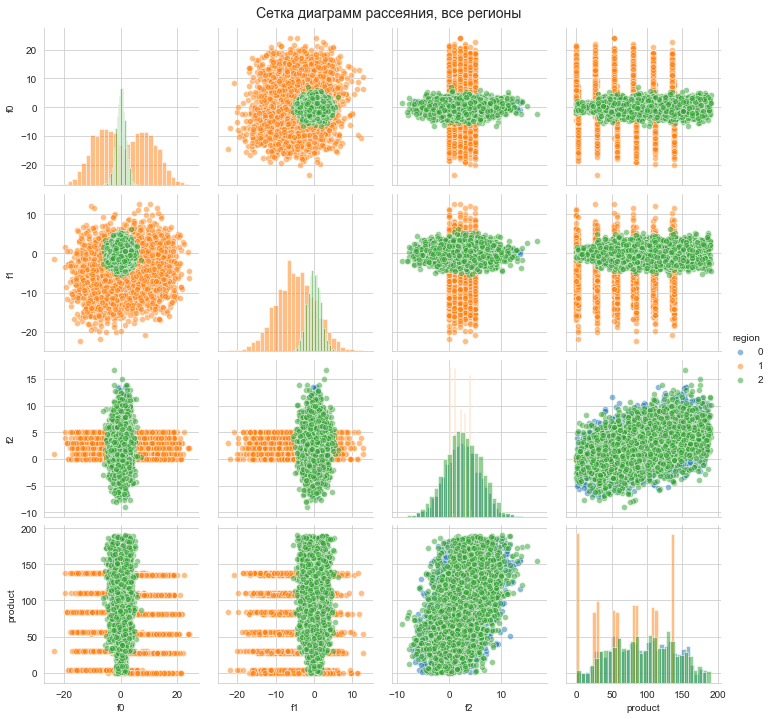

In [24]:
g = sns.pairplot(data=df_full.sample(10000, random_state=RND), vars=num_columns, 
             markers='o', 
             hue='region', 
             diag_kind='hist', diag_kws=dict(bins=30, alpha=0.5),
             plot_kws=dict(alpha=0.5))
g.fig.subplots_adjust(top=.95)
g.fig.suptitle('Сетка диаграмм рассеяния, все регионы', size=14)
plt.show()

Регион 1 очень выбивается из общей картины, по двум другим пока определённо ничего нельзя сказать. Общей моделью точно не обойтись. Посмотрю отдельно каждый регион.

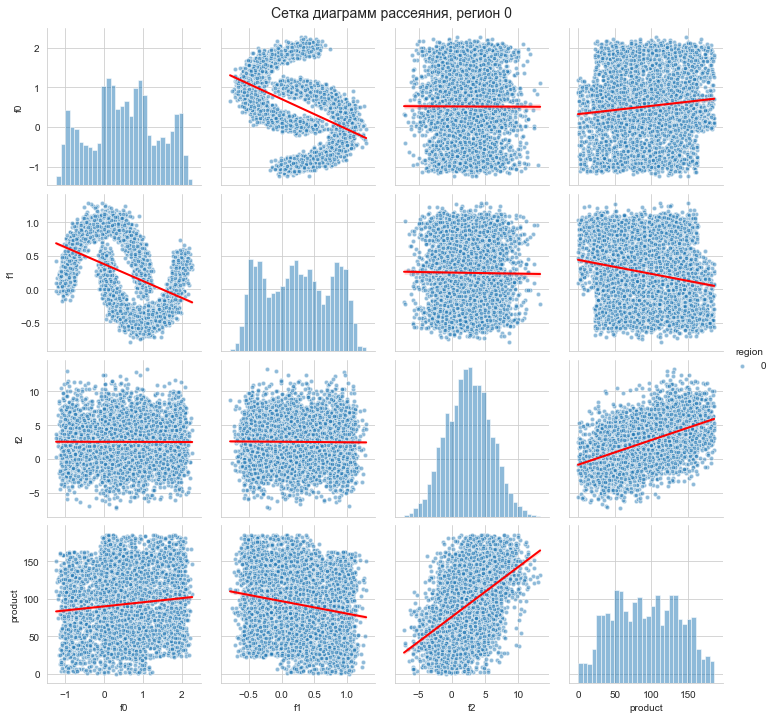

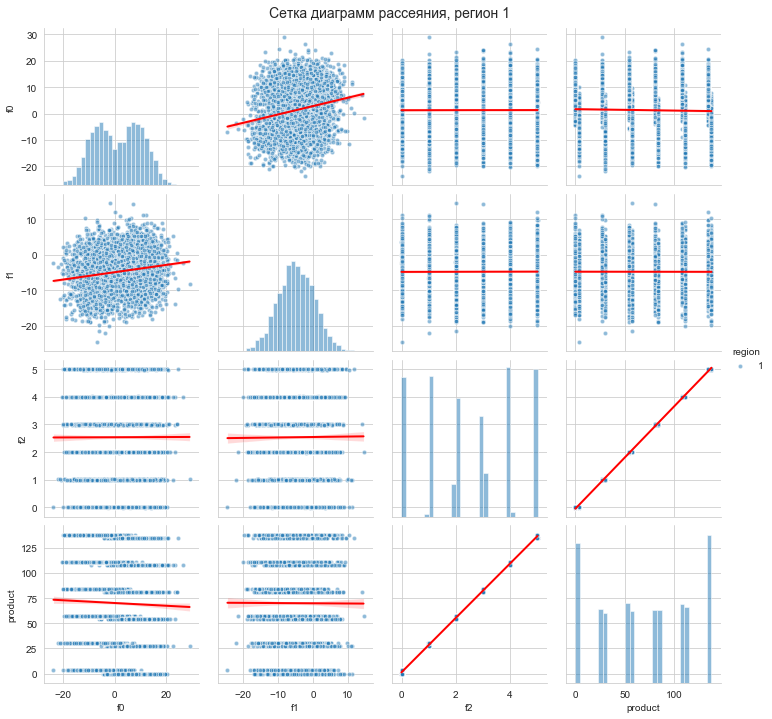

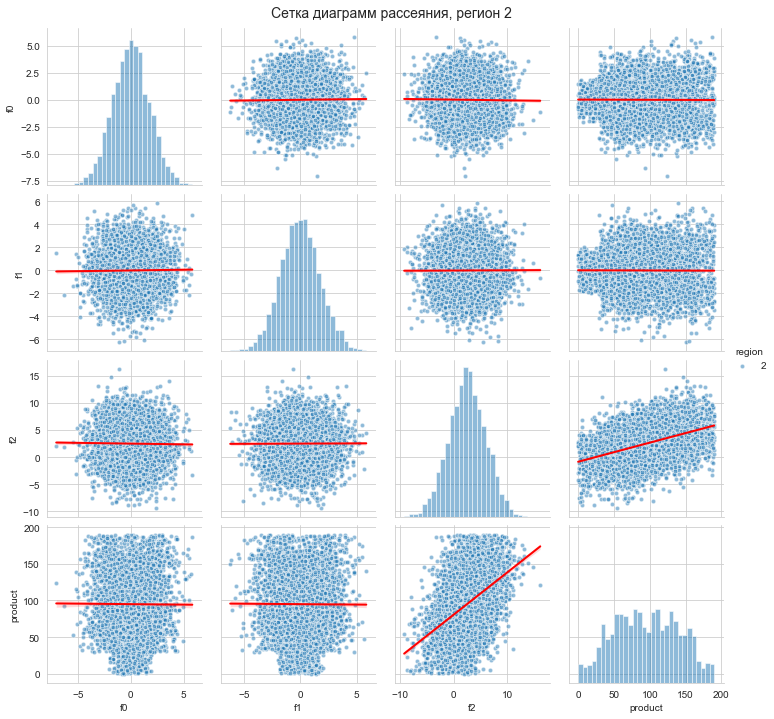

In [25]:
count=0
for df in df_list:
    g = sns.pairplot(data=df.sample(5000, random_state=RND), vars=num_columns, 
                 hue='region',
                 kind='reg', diag_kind='hist', 
                 plot_kws={'line_kws':line_kws, 'scatter_kws':scatter_kws},
                 diag_kws=dict(bins=30, alpha=0.5))
    g.fig.subplots_adjust(top=.95)
    g.fig.suptitle(f'Сетка диаграмм рассеяния, регион {count}', size=14)
    plt.show()
    count += 1

<h2 style="color:DodgerBlue">Результаты предварительного анализа</h2>

В регионе 0 данные происходят из разных кластеров, чётко видно на f0-f1 scatterplot и гистограммах f0, f1. Линейные зависимоти f0-product и f1-product связаны со смещением кластеров по оси продукта. В объектах одного кластера продукта больше, в объектах другого - меньше. Есть линейная связь f2-product, но с существенным разбросом значений.

В регионе 1 ситуация с f0 и f1 похожа. Проекция множества объектов на плоскость этих признаков - это смешение дисковидных кластеров. Однако есть крайне сильная линейная связь f2-product.

В регионе 2 виден стержень, выпадающий из распределения f0-f1-product в зону низких значений 'product'. Есть линейная связь f2-product, но разброс объектов вокруг регрессионной прямой довольно значительный.

Для всех трёх регионов можно попробовать выполнить кластеризацию объектов. В регионе 0 разделение чётко видно, в других - просматривается.

Распределение продукта везде неравномерное, с пиками. Между пиками - провалы. В регионе 1 - провалы до 0, продукт распределён дискретно.

Все три региона, судя по всему, требуют отдельных моделей. В регионе 1 объекты представляют собой смесь объектов из 2 разных кластеров. По хорошему, нужно делать отдельные модели для каждого кластера. Если признаки f0 и f1 никак не связаны с целевым признаком product, можно обойтись одной моделью, в которой метка кластера будет ступенчато корректировать оценку продукта своим коэффициентом.

<h1 style="color:SteelBlue; line-height:1.5"> 2. Исследовательский анализ. Кластеризация, создание и отбор признаков и настройка моделей</h1>

<h2 style="color:DodgerBlue">2.1 Регион 0</h2>

<h3 style="color:DodgerBlue">2.1.1 Кластеризация</h3>

Рассмотрю признаковое пространство. Поскольку признаков немного, можно всю картину увидеть на 3D scatterplot. Использую plotly

In [26]:
fig = px.scatter_3d(df_list[0].sample(10000, random_state=RND), 
                    x='f0', y='f1', z='product', color='f2',
                    color_continuous_scale=my_3d_colorscale)
fig.update_traces(marker=my_3d_marker)
fig.show()

Чётко видны 2 кластера, объекты которых, похоже, различаются только количеством продукта в зависимости от f2. Каких-то зависимостей от f0, f1 и их комбинаций не видно.

Похоже, что можно разделить данные обычной поверхностью одинарной кривизны. Попробую сперва библиотечный кластеризатор HDBSCAN (расширение DBSCAN до иерархического алгоритма), который позволит после обучения относить новые объекты к одному из кластеров с помощью predict. Такой классификатор позволит применять модель на новых данных без переучивания кластеризатора. KMeans в данном случае не подойдёт, т.к. неправильно кластеризирует области внутри полуокружностей. 

In [27]:
#на пробу создам трейн и тест таким образом. если кластеризатор устроит, включу его в пайплайн модели
clusterizer_train_X, clusterizer_valid_X = train_test_split(df0[['f0', 'f1']], test_size=0.2, random_state=RND)
hdb_clusterizer = hdbscan.HDBSCAN(min_cluster_size=10, prediction_data=True)
hdb_clusterizer.fit(clusterizer_train_X)
clusterizer_train_X.loc[:, 'hdbscan_labels'] = hdb_clusterizer.labels_
valid_labels, valid_strengths = hdbscan.approximate_predict(hdb_clusterizer, clusterizer_valid_X)
clusterizer_valid_X.loc[:, 'hdbscan_labels'] = valid_labels

In [28]:
clusterizer_train_X.hdbscan_labels.value_counts(), clusterizer_valid_X.hdbscan_labels.value_counts()

( 0    40031
  1    39927
 -1        4
 Name: hdbscan_labels, dtype: int64,
  1    10049
  0     9941
 -1        1
 Name: hdbscan_labels, dtype: int64)

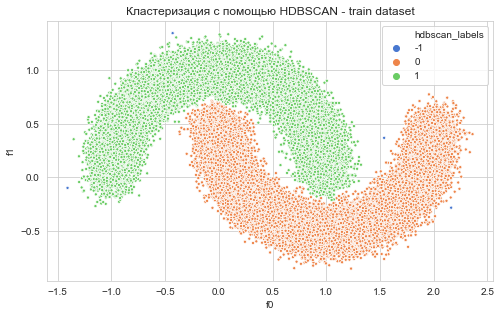

In [29]:
plt.figure(figsize=(8,8))
ax = sns.scatterplot(data=clusterizer_train_X, 
                     x='f0', y='f1', s=10, hue='hdbscan_labels', palette = 'muted')
ax.set_title('Кластеризация с помощью HDBSCAN - train dataset')
ax.set_aspect(aspect=1)
plt.show()

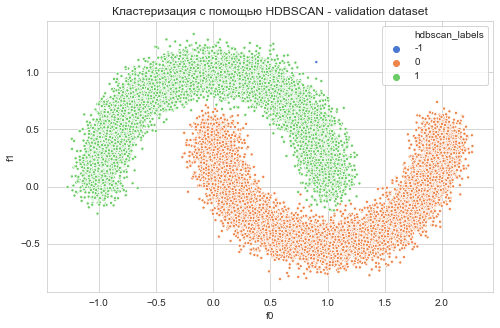

In [30]:
clusterizer_valid_X.loc[:, 'hdbscan_labels'] = valid_labels
plt.figure(figsize=(8,8))
ax = sns.scatterplot(data=clusterizer_valid_X, x='f0', y='f1', s=10, hue='hdbscan_labels', palette = 'muted')
ax.set_title('Кластеризация с помощью HDBSCAN - validation dataset')
ax.set_aspect(aspect=1)
plt.show()

Хорошее разделение, но попробую свой метод. После подбора вариантов получилась следующая функция разделения: 

$$y = 0.25 + 0.48^{\sqrt{|sin(\pi \cdot (x+0.5)|}} \cdot sin(\pi \cdot (x+0.5))$$

In [31]:
#функция порога для разделение объектов на кластеры в регионе 0
def treshold_func(x):
    y = 0.25 + np.sin(np.pi*(x+0.5)) * 0.48**np.sqrt(abs(np.sin(np.pi*(x+0.5))))
    return y

In [32]:
#кластеризатор объектов региона 0
def region0_clusterizer(df):
    df.loc[:, 'cluster'] = 1
    treshold_cond_1 = (
        ( (df.loc[:,'f0'] > -.5) & (df.loc[:, 'f0'] < 1.5) ) 
        & 
        ( df.loc[:, 'f1'] < treshold_func(df.loc[:, 'f0']) )
    )

    treshold_cond_2 = ( df.loc[:,'f0'] > 1.5 )
    
    treshold_cond = treshold_cond_1 | treshold_cond_2
    
    df.loc[treshold_cond, 'cluster'] = -1  

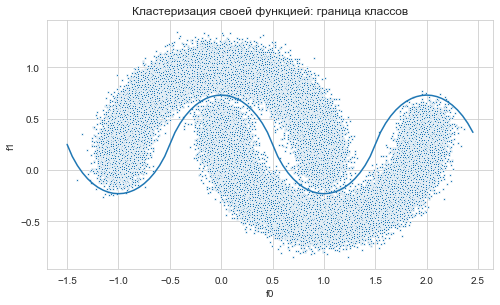

In [33]:
y = [ treshold_func(x) for x in np.arange(-1.5, 2.5, .05)]
plt.figure(figsize=(8,8))
ax = sns.scatterplot(data=df0, x='f0', y='f1', s=5)
ax.set_aspect(aspect=1)
ax.set_title('Кластеризация своей функцией: граница классов')
sns.lineplot(x=[x for x in np.arange(-1.5, 2.5, 0.05)], y=y)
plt.show()

Функцию буду использовать в области <code>[-0.5, 1.5]</code>. Вне её применю обычные булевы условия. Присвою метки {-1, 1}, это исключит проблему масштаба при стандартизации, если она понадобится.
Проверю результат:

In [34]:
region0_clusterizer(df0)
df0.loc[:, 'cluster'].value_counts()

 1    49987
-1    49966
Name: cluster, dtype: int64

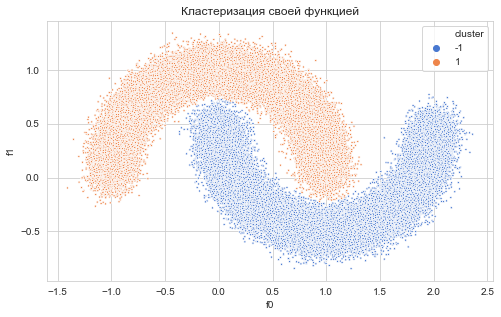

In [35]:
plt.figure(figsize=(8,8))
ax = sns.scatterplot(data=df0, x='f0', y='f1', s=5, hue='cluster', palette={-1:sns.color_palette("muted")[0], 
                                                                            1: sns.color_palette("muted")[1]})
plt.title('Кластеризация своей функцией')
ax.set_aspect(aspect=1)
plt.show()

Простая и надёжная классификация, которая подходит для задачи. Оставлю свой вариант кластеризации. Посмотрю regplot.

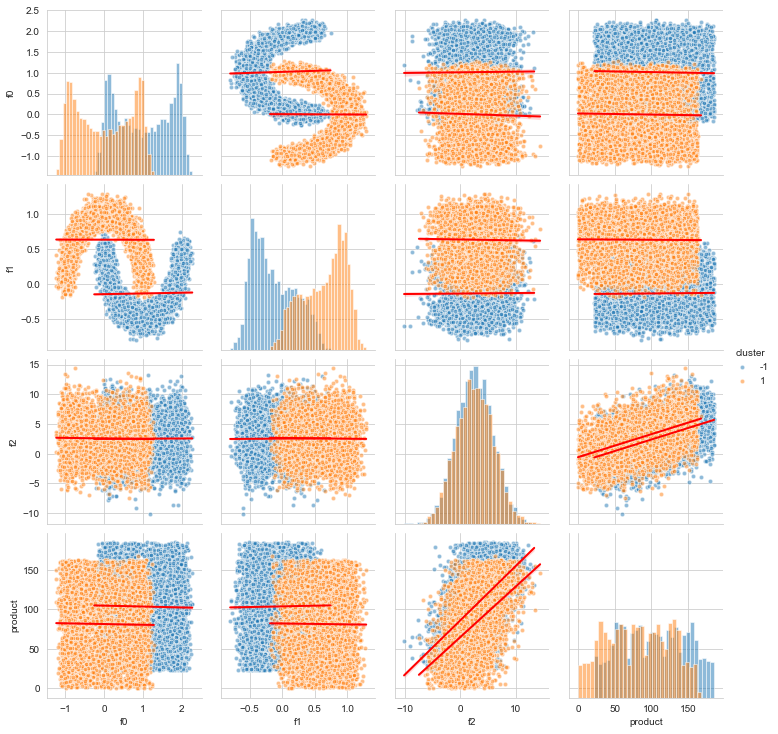

In [36]:
sns.pairplot(data=df0.sample(10000, random_state=RND), vars=num_columns, 
             hue='cluster',
             kind='reg', diag_kind='hist', 
             plot_kws={'line_kws': line_kws, 'scatter_kws':scatter_kws},
             diag_kws=dict(bins=30, alpha=0.5))
plt.show()

Вообще, полное ощущение, что кластеры получены смещением и отражением объектов по координатам f1-f0 и смещением по значению product. Идентичный характер зависимости f2-product, за исключением смещения. Можно попробовать сделать обратное преобразование, что-то вроде <code>df0['f0'] = df0['f0']-1, df0['f1'] = (df0['f1']-0.5)*(-1)</code> для среза <code>cluster==-1</code>. Но с реальными данными такое вряд ли можно делать, не имея уверенности в механизме возникновения смещения. Гистограммы распределения продукта, фактически, идентичны, но со смещением. Небольшие наклоны регрессионных прямых в остальных ячейках, скорее, результат случайности. 

Вполне возможно, что можно использовать общую модель с признаками f2 и cluster. cluster будет корректировать смещение регрессионной прямой. Второй вариант - использовать для каждого кластера свою модель.

<h3 style="color:DodgerBlue">2.1.2 Подбор моделей, определение стратегии: отдельные модели для кластеров или нет</h3>

Стоит отметить, что комбинация f0-f1 из оригинального датасете может выполнять роль кластеризатора, т.к. есть линейное смещение. По обеим осям. Нужно проверить, в каком случае модель будет работать лучше: с кластеризатором или без него. По условиям задачи нужно использовать линейную регрессию. Чтобы оценить вклады признаков, буду смотреть модули весов при них. Чтобы они были значимыми, признаки нужно привести к одному масштабу. Для этого использую <code>StandardScaler</code>. Соберу тестовый <code>pipeline Scaler-model</code>. Соберу список из 3 датасетов: оригинала и кластеров -1 и 1. Сделаю для них train и validation, сравню метрики rmse, mae и распределения. Посмотрю веса при коэффициентах и приму решение о том, какую тактику выбрать и какой набор признаков использовать.

In [37]:
df0_bad = df0[df0['cluster'] == 1]
df0_good = df0[df0['cluster'] == -1]

In [38]:
df0_list = [df0, df0_good, df0_bad]
df0_model_list = []
df0_X_train_list = []
df0_X_val_list = []
df0_y_train_list = []
df0_y_val_list = []
for i in range (0, len(df0_list)):
    X_train, X_val, y_train, y_val = train_test_split(df0_list[i].drop(columns=['product']),
                                                      df0_list[i]['product'],
                                                      test_size=0.25, random_state = RND)
    df0_X_train_list.append(X_train)
    df0_X_val_list.append(X_val)
    df0_y_train_list.append(y_train)
    df0_y_val_list.append(y_val)
    df0_model_list.append(Pipeline(steps=[('preprocessor', StandardScaler()),
                                          ('model', LinearRegression())]
                                  )
                         )

In [39]:
print('Размеры матриц признаков и вектора целевого признака для вариантов датасетов региона 0')
print(f'{"X_train ": <20}', [x.shape for x in df0_X_train_list])
print(f'{"y_train:":<20}', [y.shape for y in df0_y_train_list])
print(f'{"X_val:":<20}', [x.shape for x in df0_X_val_list])
print(f'{"y_val:":<20}', [y.shape for y in df0_y_val_list])

Размеры матриц признаков и вектора целевого признака для вариантов датасетов региона 0
X_train              [(74964, 5), (37474, 5), (37490, 5)]
y_train:             [(74964,), (37474,), (37490,)]
X_val:               [(24989, 5), (12492, 5), (12497, 5)]
y_val:               [(24989,), (12492,), (12497,)]


In [40]:
results_list, err_list = obtain_validation_results(df0_model_list, df0_X_train_list, df0_X_val_list, df0_y_train_list, df0_y_val_list)
err_list[-2] = pd.concat([err_list[-2],err_list[-1]], axis=0)
del err_list[-1]

Распределение остатков (ошибок) предсказаний для модели, работавшей на полном датасете и для 2 моделей, работавших с отдельными кластерами (результат объединён в общий вектор остатков предсказаний):

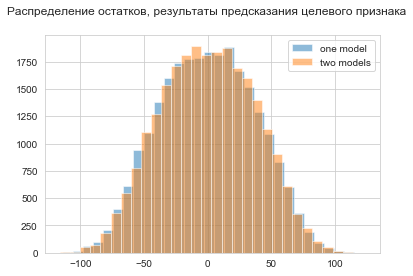

In [41]:
plt.figure(figsize=(6,4))
plt.suptitle('Распределение остатков, результаты предсказания целевого признака')
count = 0
for err, title in zip(err_list, ['one model', 'two models']):
    plt.hist(err, alpha=0.5, bins=30, label=title)
plt.legend()
plt.show()

Визуально вообще никакой разницы. Посмотрим, что по цифрам и значениям весов при коэффициентах.

In [42]:
make_validation_df(results_list).round(3)

,rmse,mae,r2,product_mean
0,37.231,30.746,0.298,92.704
1,37.019,30.580,0.246,103.789
2,37.094,30.537,0.250,81.770


In [43]:
obtain_model_coef(df0_model_list, df0_X_val_list).round(2)

,0,1,2
f0,0.09,0.03,0.01
f1,-0.01,-0.12,0.15
f2,21.47,21.68,21.43
region,0.00,0.00,0.00
cluster,-11.10,0.00,0.00


Очень схожая картина. f0, f1 - веса очень маленькие, как и ожидалось. Судя по всему, необходимости в отдельной модели для каждого кластера вообще нет. Т.к. f0 и f1 влияют на результат на уровне случайности их, видимо, можно исключить, заменив на cluster.

Проверю вообще, была ли нужна кластеризация. Повторю расчёты для изначального датасета без cluster.

In [44]:
orig_results_list, orig_err_list = obtain_validation_results([df0_model_list[0]], 
                                                             [df0_X_train_list[0][orig_features_list]], 
                                                             [df0_X_val_list[0][orig_features_list]], 
                                                             [df0_y_train_list[0]], 
                                                             [df0_y_val_list[0]])

In [45]:
make_validation_df(orig_results_list).round(3)

,rmse,mae,r2,product_mean
0,37.829,31.186,0.275,92.704


In [46]:
obtain_model_coef([df0_model_list[0]], [df0_X_train_list[0][orig_features_list]]).round(2)

,0
f0,3.33
f1,-7.09
f2,21.40


Работа проделана не зря: кластеризация улучшает результат. По <code>r^2</code> - на 10%. Попробую исключить f0 и f1 и обучить модель на признаках <code>f2 и cluster</code>.

In [47]:
results_list, err_list = obtain_validation_results([df0_model_list[0]], 
                                                             [df0_X_train_list[0][['f2', 'cluster']]], 
                                                             [df0_X_val_list[0][['f2', 'cluster']]], 
                                                             [df0_y_train_list[0]], 
                                                             [df0_y_val_list[0]])

In [48]:
make_validation_df(results_list).round(3)

,rmse,mae,r2,product_mean
0,37.231,30.746,0.298,92.704


In [49]:
obtain_model_coef([df0_model_list[0]], [df0_X_train_list[0][['f2', 'cluster']]]).round(2)

,0
f2,21.47
cluster,-11.16


Никаких изменений, кроме небольшой корректировки веса cluster. **Использую данную стратегию: обучать одну модель, использовать для обучения только признаки f2 и cluster.**

In [50]:
df0_features_list = ['f2', 'cluster']
df0_model = Pipeline(steps=[('preprocessor', StandardScaler()),
                            ('model', LinearRegression())]
                    )

df0_X_train, df0_X_val, df0_y_train, df0_y_val = train_test_split(df0[df0_features_list],
                                                                  df0['product'],
                                                                  test_size=0.25, 
                                                                  stratify = df0['cluster'],
                                                                  random_state = RND)
df0_model.fit(df0_X_train, df0_y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

In [51]:
df0_y_val_predictions = df0_model.predict(df0_X_val)

In [52]:
print_rmse_mae_r2(df0_y_val, df0_y_val_predictions)

rmse:   37.242
 mae:   30.679
 r^2:    0.295


<h2 style="color:DodgerBlue">Результаты подбора моделей и определения стратегии для региона 0</h2>

Выделены 2 кластера объектов, использована собственная пороговая функция. Проверены 3 варианта стратегий: 
- использовать исходный датасет и данные для обучения одной модели
- обучать отдельную модель для каждого кластера с последующим объединением результатов
- обучать одну модель, использовать для обучения только признаки f2 и cluster

Сработал 3й вариант: обучать одну модель, использовать для обучения только признаки f2 и cluster. Никаких изменений в метриках после удаления f1 и f2 не произошло. Оригинальный датасет без признака cluster показал самый плохой результат. И, на мой взгляд, модель для него не отражает суть вещей: незначимые признаки f1 и f2 модель использует, по сути, для кластеризации.

Модель для оценки запасов нефти в месторождениях региона 0:

In [53]:
print(df0_model)
print('\nmodel coef:', df0_model['model'].coef_.round(2))
print('model features:', df0_features_list)
print_rmse_mae_r2(df0_y_val, df0_y_val_predictions)

Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

model coef: [ 21.54 -11.22]
model features: ['f2', 'cluster']
rmse:   37.242
 mae:   30.679
 r^2:    0.295


<h2 style="color:DodgerBlue">2.2 Регион 1</h2>

<h3 style="color:DodgerBlue">2.2.1 Кластеризация</h3>

In [54]:
fig = px.scatter_3d(df_list[1].sample(10000), 
                    color_continuous_scale=my_3d_colorscale,
                    x='f0', y='f1', z='product', color='f2')
fig.update_traces(marker=my_3d_marker)
fig.show()

Как и предполагал, тут объекты располагаются по признакам f0-f1 в пересекающихся округлых кластерах. Разделить из полностью, увы, не получится, т.к. f2 для них почти идентичен. Чётко видна синтетичность данных: значения продукта до тысячных долей одинаковы в каждом кластере. Можно выполнить разделение, оставив пересекающуюся область под маркировкой 0.

Посмотрим на scatterplot. Центры окружностей кластеров лежат в координатах (-6, -6) и (9, -4). Можно подобрать радиусы окружностей и уравнение прямой, чтобы выделить 3 сегмента: пересекающуюся область, левый сегмент и правый. Сделаю это.

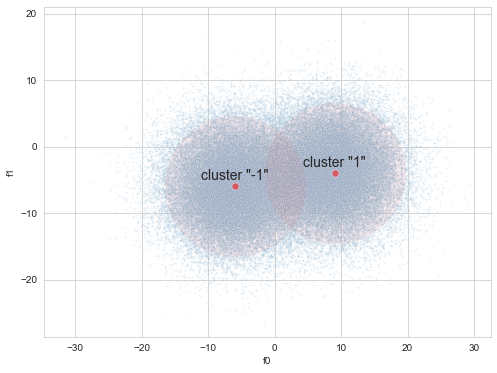

In [55]:
plt.figure(figsize=(8,8))
ax = sns.scatterplot(data=df1, x='f0', y='f1', s=3, alpha=0.1)
ax = sns.scatterplot(x=[-6,9], y=[-6,-4], s=20000, alpha=.05, color='r')
plt.text(-6, -5, 'cluster "-1"', size=14, ha='center')
plt.text(9, -3, 'cluster "1"', size=14, ha='center')
ax = sns.scatterplot(x=[-6,9], y=[-6,-4], s=50, alpha=.5, color='r')
ax.set_aspect(aspect=1)
plt.show()

In [56]:
#кластеризация объектов региона 1
def region1_clusterizer(df):
    df.loc[:, 'cluster'] = -1
    treshold_cond_1 = (
        ( ( (df.f0 - 9)**2 + (df.f1 + 4)**2 )  < 220 ) 
        | 
        ( df.f0 > -0.135*df.f1+0.625 )
    )
    treshold_cond_0 = (
        ( ( (df.f0 - 9)**2 + (df.f1 + 4)**2 )  < 220 )
        &
        ( ( (df.f0 + 6)**2 + (df.f1 + 6)**2 )  < 180 )
    )
    df.loc[treshold_cond_1, 'cluster'] = 1
    df.loc[treshold_cond_0, 'cluster'] = 0

In [57]:
region1_clusterizer(df1)

Посмотрим результат:

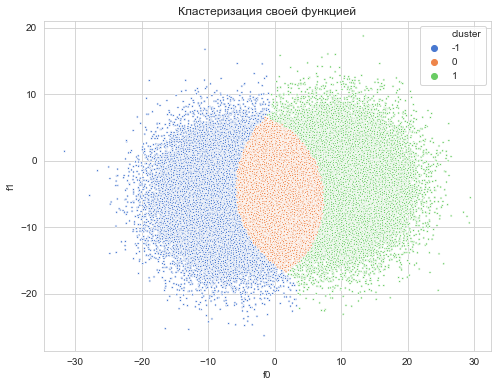

In [58]:
plt.figure(figsize=(8,8))
ax = sns.scatterplot(data=df1, x='f0', y='f1', s=5, alpha=1, hue='cluster', palette = 'muted')
ax.set_aspect(aspect=1)
ax.set_title('Кластеризация своей функцией')
plt.show()

In [59]:
fig = px.scatter_3d(df1.sample(10000), x='f0', y='f1', z='product', color='cluster', 
                    color_continuous_scale=['blue', 'orange', 'green'])
fig.update_traces(marker=my_3d_marker)
fig.show()

На мой взгляд, для начала - подходящий вариант.

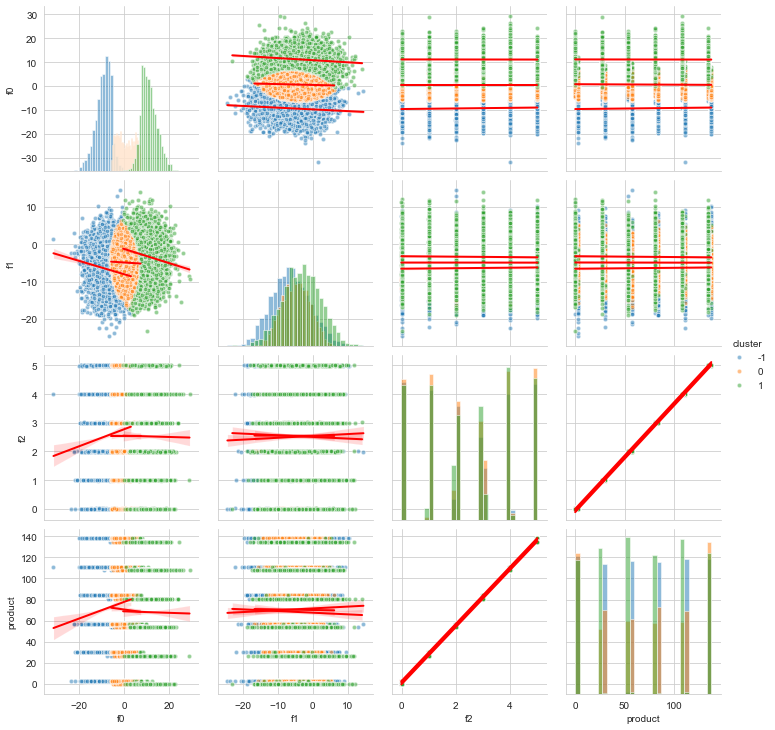

In [60]:
sns.pairplot(data=df1.sample(10000, random_state=RND), vars=num_columns, 
             hue='cluster',
             kind='reg', diag_kind='hist', 
             plot_kws={'line_kws': line_kws, 'scatter_kws':scatter_kws},
             diag_kws=dict(bins=30, alpha=0.5))
plt.show()

Видимо, перекосы диний регрессии связаны с наличием ошибочно классифицированных объектов. 
Возможно, в данном случае кластеризация не улучшит модель. 

<h3 style="color:DodgerBlue">2.2.2 Построение модели и оптимизация признаков</h3>

Начну с построения модели для текущих признаков. Попробую обучить без метки кластера и с ним, сравню результат.

In [61]:
df1_model = Pipeline(steps=[('preprocessor', StandardScaler()),
                            ('model', LinearRegression())
                           ]
                    )
df1_X_train, df1_X_val, df1_y_train, df1_y_val = train_test_split(df1.drop(columns=['product']),
                                                                  df1['product'],
                                                                  stratify=df1['cluster'],
                                                                  test_size=0.25, random_state = RND)

In [62]:
df1_model.fit(df1_X_train[orig_features_list], df1_y_train)
df1_y_val_predictions = df1_model.predict(df1_X_val[orig_features_list])
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)
df1_model['model'].coef_.round(2)

rmse:    0.890
 mae:    0.717
 r^2:    1.000


array([-1.3 , -0.11, 45.89])

Очень хорошие показатели. f0 выполняет роль кластеризатора. Посмотрю, что изменится с добавлением метки кластера

In [63]:
features_list = orig_features_list + ['cluster']
features_list

['f0', 'f1', 'f2', 'cluster']

In [64]:
df1_model.fit(df1_X_train[features_list], df1_y_train)
df1_y_val_predictions = df1_model.predict(df1_X_val[features_list])
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)
df1_model['model'].coef_.round(2)

rmse:    0.884
 mae:    0.692
 r^2:    1.000


array([-1.07, -0.09, 45.89, -0.25])

Стало чуть лучше. Попробую выполниь вручную ADD-DEL, признаков мало. Посмотрю на результат.

In [65]:
del features_list[1]
df1_model.fit(df1_X_train[features_list], df1_y_train)
df1_y_val_predictions = df1_model.predict(df1_X_val[features_list])
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)
print(df1_model['model'].coef_.round(2))
print(features_list)

rmse:    0.888
 mae:    0.692
 r^2:    1.000
[-1.05 45.89 -0.29]
['f0', 'f2', 'cluster']


In [66]:
del features_list[0]
df1_model.fit(df1_X_train[features_list], df1_y_train)
df1_y_val_predictions = df1_model.predict(df1_X_val[features_list])
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)
print(df1_model['model'].coef_.round(2))
print(features_list)

rmse:    0.984
 mae:    0.653
 r^2:    1.000
[45.89 -1.25]
['f2', 'cluster']


Самая низкая mae при наличии метки кластера и f2. Но выросла rmse. Надо попробовать поискать другой вариант кластеризации. Можно попробовать что-то вроде <code>logit model</code>. Введу признак <code>smart_cluster</code>, значение которого будет равно **логистической функции от f0:**

In [67]:
df1.loc[:, 'smart_cluster'] = 1 / ( 1 + np.exp(df1.f0) )
df1_X_train.loc[:, 'smart_cluster'] = df1.loc[:, 'smart_cluster']
df1_X_val.loc[:, 'smart_cluster'] = df1.loc[:, 'smart_cluster']

In [68]:
features_list = ['f2', 'smart_cluster']
df1_model.fit(df1_X_train[features_list], df1_y_train)
df1_y_val_predictions = df1_model.predict(df1_X_val[features_list])
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)
print(df1_model['model'].coef_.round(2))
print(features_list)

rmse:    0.759
 mae:    0.391
 r^2:    1.000
[45.89  1.4 ]
['f2', 'smart_cluster']


Результат сразу улучшился! Попробую перебрать в цикле значения при x в экспоненте логистической регрессии и выбрать лучшее.

In [69]:
rmse_list = []
mae_list = []
logit_range = (0, 2.1, 0.1)
for i in np.arange(*logit_range):
    df1.loc[:, 'smart_cluster'] = 1 / ( 1 + np.exp(i*df1.f0) )
    df1_X_train.loc[:, 'smart_cluster'] = df1.loc[:, 'smart_cluster']
    df1_X_val.loc[:, 'smart_cluster'] = df1.loc[:, 'smart_cluster']
    df1_model.fit(df1_X_train[features_list], df1_y_train)
    df1_y_val_predictions = df1_model.predict(df1_X_val[features_list])
    rmse_list.append(np.sqrt(mean_squared_error(df1_y_val, df1_y_val_predictions)))
    mae_list.append(mean_absolute_error(df1_y_val, df1_y_val_predictions))

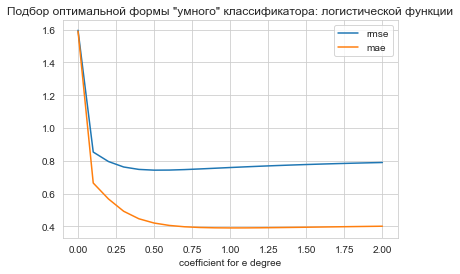

In [70]:
plt.title('Подбор оптимальной формы "умного" классификатора: логистической функции')
sns.lineplot(x=[i for i in np.arange (*logit_range)], y=rmse_list, label='rmse')
sns.lineplot(x=[i for i in np.arange (*logit_range)], y=mae_list, label='mae')
plt.xlabel('coefficient for e degree')
plt.show()

Вариант 0.75 выглядит оптимальным.

In [71]:
df1_features_list = ['f2', 'smart_cluster']
df1['smart_cluster'] = 1 / ( 1 + np.exp(0.75*df1.f0) )
df1_X_train.loc[:, 'smart_cluster'] = df1.loc[:, 'smart_cluster']
df1_X_val.loc[:, 'smart_cluster'] = df1.loc[:, 'smart_cluster']
df1_model.fit(df1_X_train[df1_features_list], df1_y_train)
df1_y_val_predictions = df1_model.predict(df1_X_val[df1_features_list])

In [72]:
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)
df1_model['model'].coef_.round(2)

rmse:    0.749
 mae:    0.396
 r^2:    1.000


array([45.89,  1.41])

По сравнению с изначальными значениями метрик (rmse: 0.890, mae: 0.717) mae улучшился более чем в 1.5 раза, rmse - почти в 1.2 раза.

<h2 style="color:DodgerBlue">Результаты подбора моделей и оптимизации признаков для региона 1</h2>

Сравнением определено, что добавление метки кластеризации в признаки улучшает метрики модели. Признаки кроме <code>f2</code> и <code>cluster</code> можно убрать без потери качества, даже с улучшением одной из метрик (<code>mse</code>). Сделана успешная попытка заменить признак <code>cluster</code> признаком на основе логистической функции.

Модель для оценки запасов нефти в месторождениях региона 1:

In [73]:
print(df1_model)
print('\nmodel coef:', df1_model['model'].coef_.round(2))
print('model features:', df1_features_list)
print_rmse_mae_r2(df1_y_val, df1_y_val_predictions)

Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

model coef: [45.89  1.41]
model features: ['f2', 'smart_cluster']
rmse:    0.749
 mae:    0.396
 r^2:    1.000


<h2 style="color:DodgerBlue">2.3 Регион 2</h2>

<h3 style="color:DodgerBlue">2.3.1 Кластеризация</h3>

Посмотрим, нужно ли кластеризировать объекты региона 2. До сих пор кластеризация работала хорошо.

In [74]:
fig = px.scatter_3d(df2.sample(10000),
                    color_continuous_scale=my_3d_colorscale,
                    x='f0', y='f1', z='product', color='f2'
                   )
fig.update_traces(marker=my_3d_marker)
fig.show()

Да, на мой взгляд, центр распределения выпадает в зону низких значений <code>product</code>. Начну с простой классификации. Всё, что попадает в радиус "стержня", классифицирую как 1, остальное - как -1.

In [75]:
def region2_clusterizer(df, treshold):
    f0_f1_radius = np.sqrt(df.f0**2 + df.f1**2)
    df.loc[:, 'cluster'] = 1
    df.loc[f0_f1_radius >= treshold, 'cluster'] = -1

In [76]:
region2_clusterizer(df2, 2.05)

In [77]:
fig = px.scatter_3d(df2.sample(10000), x='f0', y='f1', z='product', color='cluster',
                   color_continuous_scale=['blue', 'orange'])
fig.update_traces(marker=my_3d_marker)
fig.show()

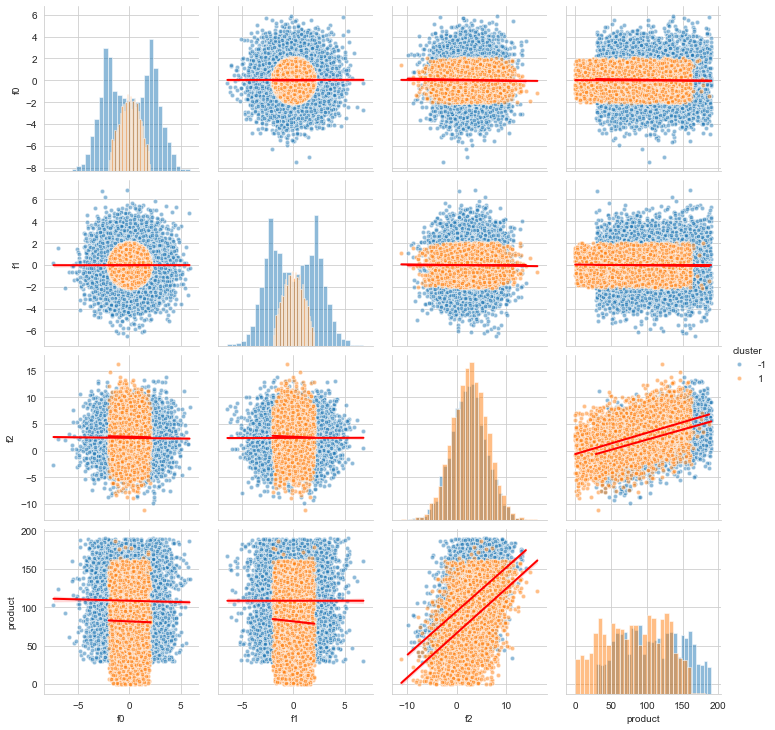

In [78]:
sns.pairplot(data=df2.sample(10000, random_state=RND), vars=num_columns, 
             hue='cluster',
             kind='reg', diag_kind='hist', 
             plot_kws={'line_kws': line_kws, 'scatter_kws':scatter_kws},
             diag_kws=dict(bins=30, alpha=0.5))
plt.show()

Картина в целом напоминает регион 0 в плане взаимосвязей. Похожи распределение продукта, связь f2-product, слабые связи f1- f0- product, смещение выборок по количеству продукта в зависимости от классов.

<h3 style="color:DodgerBlue">2.3.2 Построение модели и оптимизация признаков</h3>

Начну аналогично предыдущему варианту с разделения выборки на тренировочную и валидационную и сравнения моделей, обученных на оригинальных признаках и с добавлением метки кластера.

In [79]:
df2_model = Pipeline(steps=[('preprocessor', StandardScaler()),
                            ('model', LinearRegression())
                           ]
                    )
df2_X_train, df2_X_val, df2_y_train, df2_y_val = train_test_split(df2.drop(columns=['product']),
                                                                  df2['product'],
                                                                  stratify=df2['cluster'],
                                                                  test_size=0.25, random_state = RND)

In [80]:
df2_model.fit(df2_X_train[orig_features_list], df2_y_train)
df2_y_val_predictions = df2_model.predict(df2_X_val[orig_features_list])
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)
df2_model['model'].coef_.round(2)

rmse:   40.171
 mae:   32.948
 r^2:    0.198


array([ 0.01, -0.12, 19.95])

Худшие значения из всех. Добавлю метку кластера.

In [81]:
features_list = orig_features_list + ['cluster']
features_list

['f0', 'f1', 'f2', 'cluster']

In [82]:
df2_model.fit(df2_X_train[features_list], df2_y_train)
df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)
df2_model['model'].coef_.round(2)

rmse:   37.484
 mae:   31.086
 r^2:    0.301


array([ -0.01,  -0.1 ,  19.96, -14.33])

Гораздо лучше! <code>r^2</code> сразу увеличился в 1.5 раза, снизились rmse и mae. Теперь уберу <code>f0</code>, как признак с самым низким весом

In [83]:
del features_list[0]
df2_model.fit(df2_X_train[features_list], df2_y_train)
df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)
df2_model['model'].coef_.round(2)

rmse:   37.484
 mae:   31.086
 r^2:    0.301


array([ -0.1 ,  19.96, -14.33])

Хуже не стало, отлично. Теперь уберу <code>f1</code>.

In [84]:
del features_list[0]
df2_model.fit(df2_X_train[features_list], df2_y_train)
df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)
df2_model['model'].coef_.round(2)

rmse:   37.484
 mae:   31.086
 r^2:    0.301


array([ 19.96, -14.33])

И вновь пришли к <code>f2 и cluster</code>. Можно попробовать ещё улучшить, аналогично предыдущему варианту. В качестве умного классификатора также взять логистическую функцию, но смещённую. В качестве х нужно подавать расстояние от оси цилиндра, $\sqrt{(f0^{2} + f1^{2})}$. Границы лежат между 5 и -5.

In [85]:
features_list

['f2', 'cluster']

In [86]:
features_list = ['f2', 'smart_cluster']
rmse_list = []
mae_list = []
logit_coef = np.sqrt(df2.f0**2 + df2.f1**2)
logit_range = (0, 10, 0.5)
for i in np.arange(*logit_range):   
    df2.loc[:, 'smart_cluster'] = 1 / (1 + np.exp( i*logit_coef - 6 ))
    df2_X_train.loc[:, 'smart_cluster'] = df2.loc[:, 'smart_cluster']
    df2_X_val.loc[:, 'smart_cluster'] = df2.loc[:, 'smart_cluster']
    df2_model.fit(df2_X_train[features_list], df2_y_train)
    df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
    rmse_list.append(np.sqrt(mean_squared_error(df2_y_val, df2_y_val_predictions)))
    mae_list.append(mean_absolute_error(df2_y_val, df2_y_val_predictions))

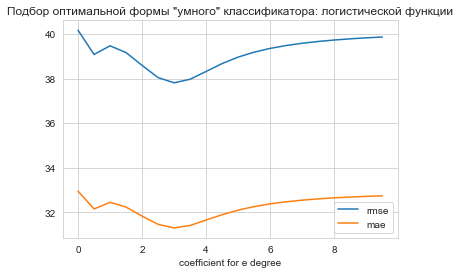

In [87]:
plt.title('Подбор оптимальной формы "умного" классификатора: логистической функции')
sns.lineplot(x=[i for i in np.arange (*logit_range)], y=rmse_list, label='rmse')
sns.lineplot(x=[i for i in np.arange (*logit_range)], y=mae_list, label='mae')
plt.xlabel('coefficient for e degree')
plt.show()

In [88]:
df2.loc[:, 'smart_cluster'] = 1 / (1 + np.exp( 3*logit_coef -6 ))
df2_X_train.loc[:, 'smart_cluster'] = df2.loc[:, 'smart_cluster']
df2_X_val.loc[:, 'smart_cluster'] = df2.loc[:, 'smart_cluster']
df2_model.fit(df2_X_train[features_list], df2_y_train)
df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)
df2_model['model'].coef_.round(2)

rmse:   37.811
 mae:   31.297
 r^2:    0.289


array([ 19.95, -13.35])

А вот в данном случае логистической функции не удалось превзойти простой ступенчатый кластеризатор. Попробую ему подобрать оптимальный порог.

In [89]:
features_list = ['f2', 'cluster']
rmse_list = []
mae_list = []
treshold_range = (0, 5, 0.1)
for treshold in np.arange(*treshold_range):   
    region2_clusterizer(df2, treshold)
    df2_X_train.loc[:, 'cluster'] = df2['cluster']
    df2_X_val.loc[:, 'cluster'] = df2['cluster']
    df2_model.fit(df2_X_train[features_list], df2_y_train)
    df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
    rmse_list.append(np.sqrt(mean_squared_error(df2_y_val, df2_y_val_predictions)))
    mae_list.append(mean_absolute_error(df2_y_val, df2_y_val_predictions))

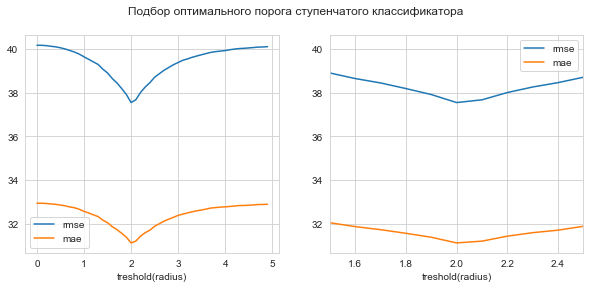

In [90]:
plt.figure(figsize=(10,4))
plt.suptitle('Подбор оптимального порога ступенчатого классификатора')
plt.subplot(121)
sns.lineplot(x=[i for i in np.arange (*treshold_range)], y=rmse_list, label='rmse')
sns.lineplot(x=[i for i in np.arange (*treshold_range)], y=mae_list, label='mae')
plt.xlabel('treshold(radius)')
plt.subplot(122)
sns.lineplot(x=[i for i in np.arange (*treshold_range)], y=rmse_list, label='rmse')
sns.lineplot(x=[i for i in np.arange (*treshold_range)], y=mae_list, label='mae')
plt.xlabel('treshold(radius)')
plt.xlim(1.5, 2.5)
plt.show()

Оптимальный радиус - около 2. После точной настройки лучшим оказался 2.04. Его и установлю.

In [91]:
df2_features_list = ['f2', 'cluster']
region2_clusterizer(df2, 2.04)
df2_X_train.loc[:, 'cluster'] = df2['cluster']
df2_X_val.loc[:, 'cluster'] = df2['cluster']
df2_model.fit(df2_X_train[features_list], df2_y_train)
df2_y_val_predictions = df2_model.predict(df2_X_val[features_list])
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)
df2_model['model'].coef_.round(2)

rmse:   37.453
 mae:   31.061
 r^2:    0.303


array([ 19.96, -14.43])

По сравнению с изначальными значениями метрик (rmse: 40.171, mae: 32.948, r^2: 0.198) rmse и mae улучшились на 6-7%. r^2 улучшилась почти в полтора раза

<h2 style="color:DodgerBlue">Результаты подбора моделей и оптимизации признаков для региона 2</h2>

Добавление метки кластеризации в признаки улучшает метрики модели. Признаки кроме <code>f2</code> и <code>cluster</code> можно убрать без потери качества.

Модель для оценки запасов нефти в месторождениях региона 2:

In [92]:
print(df2_model)
print('\nmodel coef:', df2_model['model'].coef_.round(2))
print('model features:', df2_features_list)
print_rmse_mae_r2(df2_y_val, df2_y_val_predictions)

Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

model coef: [ 19.96 -14.43]
model features: ['f2', 'cluster']
rmse:   37.453
 mae:   31.061
 r^2:    0.303


<h1 style="color:SteelBlue"> Результаты создания и отбора признаков и настройки моделей</h1>

Анализ показал, что наборы данных состоят из объектов, принадлежащих разным кластерам. Особенно явно это заметно в регионе 0. Признаки f0 и f1 не связаны с целевым признаком (только из-за сдвигов кластеров друг относительно друга; это не связано с влиянием f1 и f2 на целевой признак). Однако, f0 и f1 полезны для кластеризации и с их помощью получены значимые признаки: метки кластеров и значение логистической функции. Эти признаки использованы при обучении моделей. Благодаря такому подходу удалось улучшить метрики моделей относительно начального набора признаков. Например, в модели для региона 2 удалось увеличить метрику r^2 в 1.5 раза относительно оригинального пространства признаков. А в регионе 1 mae модели снизилась почти в 1.5 раза.

Получены модели:

In [93]:
models_list = [df0_model, df1_model, df2_model]

y_val_list = [df0_y_val, df1_y_val, df2_y_val]
y_train_list = [df0_y_train, df1_y_train, df2_y_train]

y_val_predicted_list = [df0_y_val_predictions, df1_y_val_predictions, df2_y_val_predictions]

X_train_list = [df0_X_train[df0_features_list], df1_X_train[df1_features_list], df2_X_train[df2_features_list]]
X_val_list = [df0_X_val[df0_features_list], df1_X_val[df1_features_list], df2_X_val[df2_features_list]]

final_features_list = [df0_features_list, df1_features_list, df2_features_list]

In [94]:
i = 0
for model in models_list:
    print(f'\nРегион {i}')
    print(model)
    print('\nmodel coef:', model['model'].coef_.round(2))
    print('model features:', final_features_list[i])
    i += 1


Регион 0
Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

model coef: [ 21.54 -11.22]
model features: ['f2', 'cluster']

Регион 1
Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

model coef: [45.89  1.41]
model features: ['f2', 'smart_cluster']

Регион 2
Pipeline(memory=None,
         steps=[('preprocessor',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('model',
                 LinearRegression(copy_X=True, fit_in

In [95]:
validation_results_list_dc, validation_residuals_list_dc = obtain_validation_results(models_list, 
                                                                                   X_train_list, 
                                                                                   X_val_list, 
                                                                                   y_train_list, 
                                                                                   y_val_list)
make_validation_df(validation_results_list_dc).round(3)

,rmse,mae,r2,product_mean
0,37.242,30.679,0.295,92.317
1,0.749,0.396,1.000,69.042
2,37.453,31.061,0.303,95.449


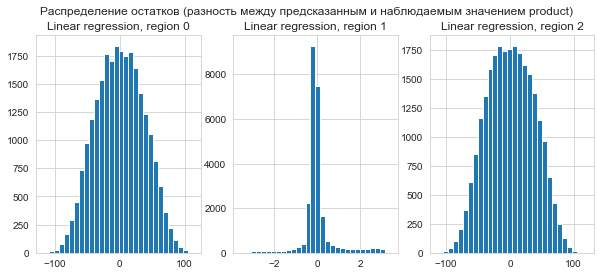

In [96]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,4))
for i in range(0, len(axs)):
    axs[i].set_title(f'Linear regression, region {i}')
    axs[i].hist(y_val_list[i]-y_val_predicted_list[i], bins=30)
plt.suptitle('Распределение остатков (разность между предсказанным и наблюдаемым значением product)')
plt.show()

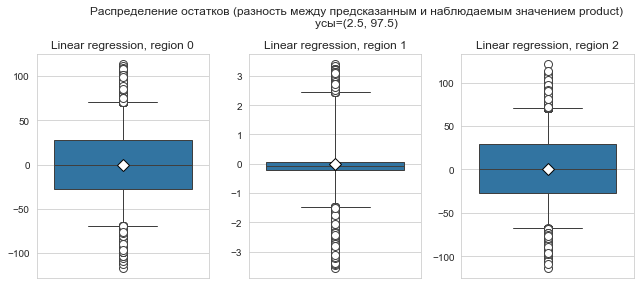

In [97]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,4))

meanpointprops = dict(marker='D', markeredgecolor='black',
                      markersize=8, markerfacecolor='white')

flierprops = dict(marker='o', markerfacecolor='white', markersize=8,
                  linestyle='none')


for i in range(0, len(axs)):
    sns.boxplot(ax=axs[i], y=y_val_list[i] - y_val_predicted_list[i], 
                whis=(2.5, 97.5), 
                meanprops=meanpointprops, 
                flierprops=flierprops, linewidth=1, showmeans=True)
    axs[i].set_title(f'Linear regression, region {i}')
    axs[i].set_ylabel('') 

plt.suptitle('Распределение остатков (разность между предсказанным и наблюдаемым значением product)\nусы=(2.5, 97.5)\n')
plt.tight_layout(rect=(0, 0, 0.9, 0.9))
plt.show()

In [98]:
dc = DummyRegressor(strategy='mean')
dc_models_list = [dc for i in range(0,len(df_list))]
validation_results_list_dc, validation_residuals_list_dc = obtain_validation_results(dc_models_list, 
                                                                                   X_train_list, 
                                                                                   X_val_list, 
                                                                                   y_train_list, 
                                                                                   y_val_list)

In [99]:
print('DummyRegressor (mean strategy) validation')
make_validation_df(validation_results_list_dc).round(2)

DummyRegressor (mean strategy) validation


,rmse,mae,r2,product_mean
0,44.35,37.73,-0.0,92.32
1,46.03,40.42,-0.0,69.04
2,44.85,37.91,-0.0,95.45


Валидация дамми-регрессором показывает адекватность построенных моделей.

<h1 style="color:SteelBlue; line-height:1.5"> 3. Расчёт рисков разработки месторождений в регионах на основе предсказаний моделей</h1>

Модели для оценки объёма нефти в месторождении подготовлены. Теперь нужно сымитировать работу моделей в реальных условиях и предложить из трёх регионов для потенциальной разработки наиболее выгодный. Т.е. тот, в котором риски убытков минимальны, а прибыль - максимальна.

Анализ буду выполнять техникой Bootstrap. Из валидационной выборки буду извлекать в каждом цикле с возвратом 500 объектов (соответствуют 500 исследованным месторождениям). Среди них буду выбирать 200 лучших (соответствуют месторождениям, рекомендованным к разработке). Затем для этих выбранных месторождений посчитаю реальную прибыль на основе данных о реальном количестве сырья в месторождениях (по данным целевого признака валидационной выборки). Сложу прибыль от всех месторождений. Если суммарная прибыль меньше или равна 0 (регион убыточен), к счётчику прибавлю единицу. 

Под риском убытка буду понимать долю случаев, когда выбранные моделью из бутстрап выборки топ-200 месторождений (лучшие по оценке модели) в сумме не принесли прибыли. Т.е. когда разработка региона оказалась убыточной.

Под прибылью буду понимать валовую прибыль. Т.е. разность между выручкой от скважины и её себестоимостью. Функцию расчёта прибыли объединил с бутстрапом.

Для того, чтобы скважина приносила валовую прибыль, выручка с добытой нефти должна превысить расходы на разработку скважины. Т.е.: 

<code>product x 1000 x доход с одного барреля > стоимость разработки скважины (= весь бюджет на разработку / число скважин)</code>

Отсюда легко получить объём запасов, необходимый для того, чтобы скважина приносила валовую прибыль:

In [100]:
min_oil_for_profit = OILWELL_COST / (1000*PROFIT_PER_BARREL)
print(f"""Минимальный объём запасов, необходимый для окупаемости скважины: 
не менее {min_oil_for_profit:.1f} тыс. баррелей""")

Минимальный объём запасов, необходимый для окупаемости скважины: 
не менее 111.1 тыс. баррелей


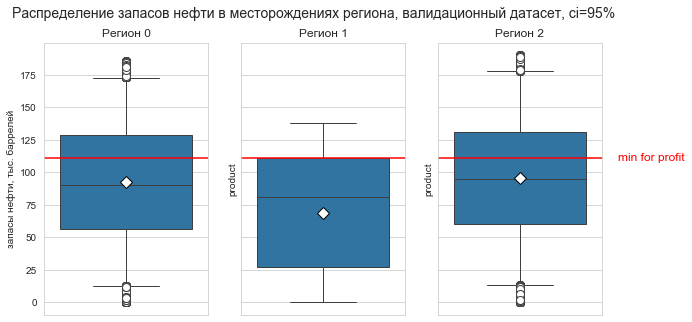

In [101]:
fig, axs = plt.subplots(nrows=1, ncols=len(y_val_list), figsize=(10,5), sharey=True)
i = 0
plt.suptitle('Распределение запасов нефти в месторождениях региона, валидационный датасет, ci=95%', size=14)

for y_val in y_val_list:
    
    sns.boxplot(ax=axs[i], y=y_val, 
                         whis=(2.5, 97.5), 
                         meanprops=meanpointprops, flierprops=flierprops, 
                         linewidth=1, showmeans=True)
    axs[i].axhline(min_oil_for_profit, color='r')
    axs[i].set_title(f'Регион {i}')
    i += 1
axs[0].set_ylabel('запасы нефти, тыс. баррелей')
axs[0].text(3, min_oil_for_profit, 'min for profit', color='r', ha='left', va='center', size=12)
plt.show()

В среднем во всех регионах нефти в скважинах меньше, чем нужно. Среднее значение, верхний квартиль и 97.5 процентиль выше всех лежат у месторождений региона 2. Поскольку мы имеем возможность из 500 скважин выбрать 40% (200 лучших), т.е. лежащих по оси **y** выше средних значений, то логично предположить, что среди топа скважин этого региона убыточные будут попадаться реже всего. Модели для регионов 0 и 2 имеют схожие метрики, поэтому регион 2 имеет преимущество. Только 25% скважин региона 1 лежат выше уровня минимума. Думаю, даже высокая точность работы модели в этом случае не выручит, ведь нам нужно 40% из случайной выборки, а не 25%. Однако определённую уверенность получим только после bootstrap-тестов.

In [102]:
%%time
region_true_profit_list = []
region_predicted_profit_list = []
params_df = pd.DataFrame()

for i in range(0,len(df_list)):
    print(f'\nРегион {i}')
    true_profit_list, predicted_profit_list, reg_params_df = bootstrap_risk_test(y_val_list[i],
                                                                             y_val_predicted_list[i], 
                                                                             cycles=1000)
    
    reg_params_df.loc[:, 'region'] = i
    if i == 0:
        params_df = reg_params_df
    else:
        params_df = pd.concat([params_df, reg_params_df], axis=0)
    region_true_profit_list.append(true_profit_list)
    region_predicted_profit_list.append(predicted_profit_list)


Регион 0
PermutationResult:  
    
    Число бутстрап выборок из набора данных: 1000
    Месторождений в каждой выборке: 500
    Из них отбирается для разработки: 200 лучших по предсказанному объёму запасов нефти
    
    1. средняя прибыль с региона: 
     - по предсказанию модели: 433.79 +/- 7.63 млн. руб., 
     - по факту: 461.57 +/- 16.94 млн. руб.,
       
    2. весь регион был убыточен: 
     - по предсказанию модели: в 0 из 1000 случаев (0.00%)
     - по факту: в 34 из 1000 случаев (3.40%)
    
    3. доля убыточных месторождений среди всех исследованных:
     - по предсказанию модели: 77.72%
     - по факту: 63.66%
     
    4. доля убыточных месторождений среди всех отобранных для разработки:
     - по предсказанию модели: 44.30%
     - по факту: 41.70%

Регион 1
PermutationResult:  
    
    Число бутстрап выборок из набора данных: 1000
    Месторождений в каждой выборке: 500
    Из них отбирается для разработки: 200 лучших по предсказанному объёму запасов нефти
    
    1

In [103]:
params_df.reset_index(inplace=True, drop=True)
params_df.iloc[:, 1:] = params_df.iloc[:, 1:].astype('float')

In [104]:
params_df.round(3)

,source,total_profit_mean,95_ci_lower,95_ci_upper,sem,total_unprofit_ratio,explored_unprofit_ratio,chosen_unprofit_ratio,region
0,predicted,433.794,426.307,441.281,3.815,0.000,0.777,0.443,0.0
1,true,461.574,444.955,478.193,8.469,0.034,0.637,0.417,0.0
2,predicted,473.960,461.440,486.480,6.380,0.012,0.820,0.550,1.0
3,true,474.380,461.871,486.890,6.375,0.011,0.834,0.585,1.0
4,predicted,681.419,673.985,688.853,3.788,0.000,0.741,0.353,2.0
5,true,794.949,778.240,811.659,8.515,0.004,0.617,0.402,2.0


In [105]:
sem = np.array(2*params_df['sem'])

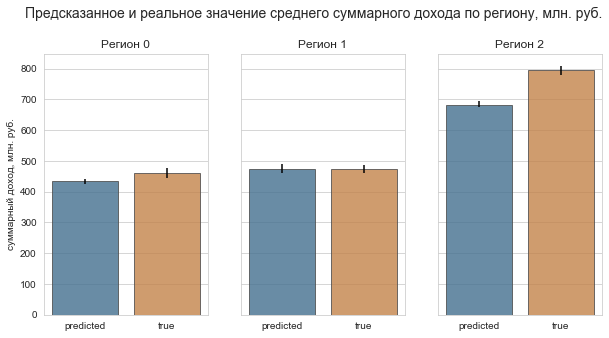

In [106]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,5), sharey=True)
i = 0
for region in params_df.region.unique():
    sns.barplot(ax=axs[i], x='source', y='total_profit_mean', 
                data=params_df[params_df.region==region],
                yerr = [sem[2*i:2*i+2], sem[i:i+2]],
                saturation = 0.5,
                edgecolor=".3",
                alpha=0.8)
    axs[i].set_title(f'Регион {i}')
    axs[i].set_xlabel('')
    if i >= 1:
        axs[i].set_ylabel('')
    else:
        axs[i].set_ylabel('суммарный доход, млн. руб.')
    i += 1


plt.subplots_adjust(top=0.85)
plt.suptitle('Предсказанное и реальное значение среднего суммарного дохода по региону, млн. руб.', fontsize=14)
plt.show()

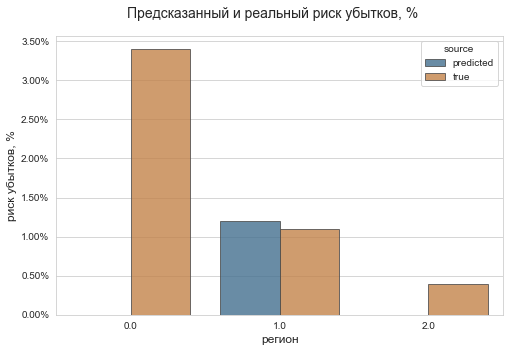

In [107]:
plt.figure(figsize=(8,5))

ax = sns.barplot(x='region', y='total_unprofit_ratio', hue='source',
            data=params_df,
            saturation = 0.5,
            edgecolor=".3",
            alpha=0.8)

plt.xlabel('регион', size=12)
plt.ylabel('риск убытков, %', size=12)
plt.subplots_adjust(top=0.9)
plt.suptitle('Предсказанный и реальный риск убытков, %', fontsize=14)
ax.yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

In [108]:
for i in range(0,len(df_list)):
    unprofit_ratio = (y_val_list[i]*1000 < (OILWELL_COST/PROFIT_PER_BARREL)).sum() / len(y_val_list[i])
    print(f'Фактический % убыточных месторождений в регионе {i}, весь валидационный датасет: {unprofit_ratio:.2%}')

Фактический % убыточных месторождений в регионе 0, весь валидационный датасет: 63.61%
Фактический % убыточных месторождений в регионе 1, весь валидационный датасет: 83.36%
Фактический % убыточных месторождений в регионе 2, весь валидационный датасет: 61.63%


In [109]:
cols_list = [i for i in range (0, len(df_list))]
true_profit = pd.DataFrame(data = np.array(region_true_profit_list).T) / 10**6
predicted_profit = pd.DataFrame(data = np.array(region_predicted_profit_list).T) / 10**6
true_profit.columns = cols_list
predicted_profit.columns = cols_list
true_profit.loc[:, 'type'] = 'true'
predicted_profit.loc[:, 'type'] = 'predict'

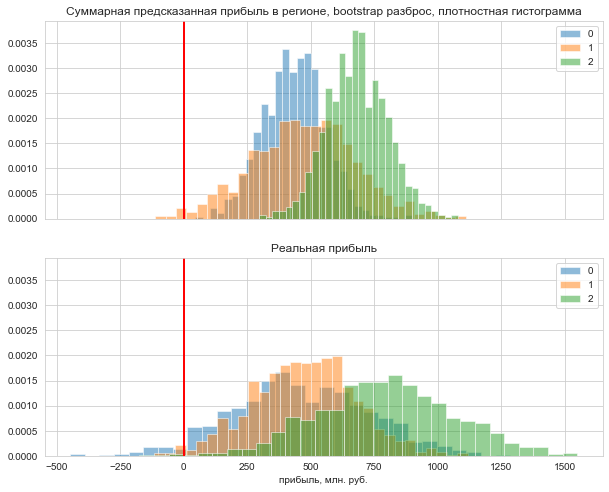

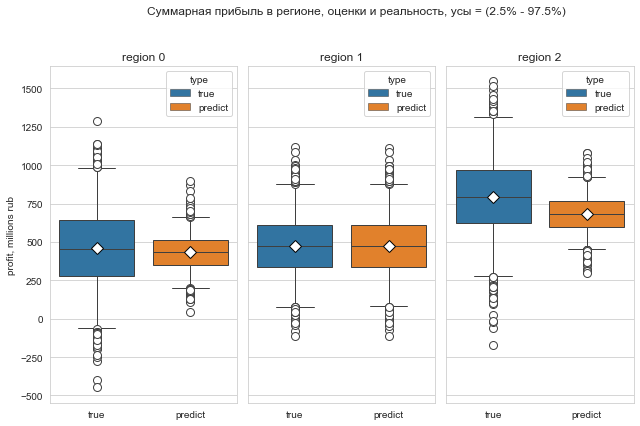

In [110]:
fig, axs = plt.subplots(ncols=1, nrows=2, figsize=(10,8), sharex=True, sharey=True)
ax1, ax2 = axs.flatten()
for col in cols_list:
    ax1.axvline(0, color='r')
    ax2.axvline(0, color='r')
    ax1.hist(predicted_profit[col], alpha=0.5, label=col, bins=30, density=True)
    ax2.hist(true_profit[col], alpha=0.5, label=col, bins=30, density=True)

ax1.legend()
ax2.legend()
ax1.set_title('Суммарная предсказанная прибыль в регионе, bootstrap разброс, плотностная гистограмма')
ax2.set_title('Реальная прибыль')
ax2.set_xlabel('прибыль, млн. руб.')
plt.show()


profit = pd.concat([true_profit, predicted_profit], axis=0)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,6), sharey=True)
for i in range(0, len(axs)):
    sns.boxplot(ax=axs[i], x='type', y=cols_list[i], data=profit, 
                whis=(2.5, 97.5), width=0.8, dodge=False,
                meanprops=meanpointprops, flierprops=flierprops, linewidth=1, showmeans=True, hue='type')
    
    axs[i].set_title(f'region {i}')
    axs[i].set_xlabel('')
    
    
axs[0].set_ylabel('profit, millions rub')
axs[1].set_ylabel('') 
axs[2].set_ylabel('') 

plt.suptitle('Суммарная прибыль в регионе, оценки и реальность, усы = (2.5% - 97.5%)')
plt.tight_layout(rect=(0, 0, 0.9, 0.9))
plt.show()

По распределениям видно, что предсказания моделей имеют меньшую дисперсию, чем реальные данные. Это естественно, т.к. модели линейны. 

Подтвердились предположения о том, что *регион 2* окажется наименее ри́сковым. Однако, несмотря на то, что бо́льшая часть объектов *региона 1* находится за чертой "убыточности", риск убытков там оказался почти в 3 раза ниже, чем в *регионе 0*! Но доля убыточных месторождений среди всех исследованных в *регионе 1*, всё же, самая высокая. Что, в целом, подтверждает корректность анализа: ведь в регионе больше объектов с низким значением product, значит, они должны чаще попадать в выборку.

**Регион 2** выигрывает как по проценту риска (он оказался убыточным только в 4 случаях из 1000; для сравнения: регион №1 принёс убытки в 11 случаях), так и по среднему суммарному доходу, который в 1.8 раз выше, чем в остальных регионах. Для этого региона модель несколько хуже остальных предсказала среднее значение, но ушла в меньшую сторону. Это лучше, чем в большую (меньше риск неверной оценки потенциально убыточного месторождения). Вероятно, такой эффект связан с серьёзной долей объектов, находящихся в "стержневом" кластере, объёмы продукта в котором небольшие. Поэтому модель несколько занижает результаты для объектов другого кластера. Кстати, вполне возможно, что из-за этой особенности регион 2 показал лучший результат.

Перед тем, как сделать, казалось бы, очевидный выбор между регионами 2 и 1, **проведу A/B тестирование. Проверю, могли существующие различия между средними значениями прибыли в регионах 1 и 2 возникнуть случайно, или нет. Стандартно приму alpha = 0.05 и нулевую гипотезу о том, что различия случайны.**

Буду сравнивать различия, полученные на реальных данных, т.к. именно по ним принимается решение. Применю перестановочный тест и t-тест в качестве контроля.

In [111]:
print(f'\nРегион 1 и 2, сравнение средних, реальные значения')
print( AB_permutation_test(true_profit.loc[:,2], true_profit.loc[:, 1]) )
print( st.ttest_ind(true_profit.loc[:,2], true_profit.loc[:, 1]) )


Регион 1 и 2, сравнение средних, реальные значения
AB_PermutationResult(means_difference=320.5692333909029, iterations=10000, pvalue=0.0)
Ttest_indResult(statistic=30.137310302546606, pvalue=8.468564443198396e-165)


Результаты A/B тестирования показывают, что полученный результат случайно возникнуть, фактически, не мог. Отвергаю нулевую гипотезу о случайности различий средней прибыли в регионах 1 и 2.

По совокупности полученных данных для разработки скважин наиболее перспективным (в связке с построенной моделью) в плане пибыли и наименее рисковым в плане вероятных убытков является **РЕГИОН 2. Средняя суммарная фактическая прибыль по результатам моделирования тысячи вариантов составила 794.95 млн. руб. 95% доверительный интервал для среднего значения прибыли: 778.24 - 811.66 млн. руб.**. **Риск убытков: 4 из 1000 случаев (0.40%)**

<h1 style="color:SteelBlue; line-height:1.5">Общий вывод</h1>

Рассмотрены 3 региона потенциальной нефтедобычи. Распределение признаков во всех регионах неравномерное, признаки принадлежат разным кластерам. Между кластерами наблюдается ступенчатое изменение целевого показателя. Кластеры региона 0 напоминают линейное отражение со смещением объектов одного кластера в пространство другого. 

Для всех трёх регионов прослеживается устойчивая связь признака f2 с объёмом запасов нефти. Этот факт, в сочетании с успешными попытками разделения объектов на кластеры, позволил улучшить качество моделей. Некоторые метрики (например r^2) удалось улучшить почти в полтора раза. Также в пределах 5-10% удалось улучшить метрики rmse и mae. Все модели в итоге обучены на двух признаках: метке или значении функции вероятности принадлежности к кластеру и признаке f2. Модели простые и понятные, легко интерпретируемые.

На базе построенных моделей выполнена оценка трёх регионов с точки зрения рисков и потенциальной прибыли от разработки месторождений нефти. Сымитирована 1000 случаев исследования и разработки каждого региона: получение результатов исследования признаков для 500 месторождений нефти, прогноз запасов нефти в этих месторождениях при помощи моделей и последующий выбор двуста лучших месторождения для разработки. Оценены риски применения такого подхода в каждом из регионов с точки зрения получения убытков. Для имитации исследований использована техника повторного отбора: bootstrap. Оказалось, что наибольшие риски несёт применение данного подходя в регионе 0. В 34 случаях из 1000 регион оказывался убыточным после разработки месторождений. В регионе №1 модель показывает высокую точность предсказаний, но сам регион - самый бедный по запасам нефти (в среднем 69 тысяч +\- 600 баррелей на месторождение; в регионах 0 и 2 - более 90 тыс. баррелей) Поэтому работать в нём более рискованно, а потенциальная средняя прибыль почти в 2 раза ниже, чем в регионе 2 (474.38 +/- 12.75 млн. руб. против 794.95 +/- 17.03 млн. руб.).

**РЕГИОН 2 (соответствующий geo_data_2.csv) выглядит наиболее перспективным для разработки месторождений.
Средняя суммарная фактическая прибыль по результатам моделирования тысячи вариантов составила 794.95 млн. руб. 95% доверительный интервал для среднего значения прибыли: 778.24 - 811.66 млн. руб.. Риск убытков: 4 из 1000 случаев (0.40%)**

<h1>Тесты xgboost и catboost</h1>

Заинтересовало, как с подобной задачей справятся алгоритмы градиентного бустинга. Также было интересно в качестве тренировки. Оказалось, что линейная регрессия не уступает им в данной задаче, и даже превосходит.

In [112]:
params = \
     {'max_depth': 3,
      'n_estimators': 300,
      'eta': 0.05,
      'subsample': 0.8
     }


pipe_xgb = Pipeline(steps=[('preprocessor', StandardScaler()),
                           ('model', xgb.XGBRegressor(**params))
                          ])

models_list_xgb = [pipe_xgb for df in df_list]

validation_results_list_xgb, validation_residuals_list_xgb = obtain_validation_results(models_list_xgb, 
                                                                               X_train_list, 
                                                                               X_val_list, 
                                                                               y_train_list, 
                                                                               y_val_list)

In [113]:
print('XGBoost validation')
make_validation_df(validation_results_list_xgb).round(2)

XGBoost validation


,rmse,mae,r2,product_mean
0,37.23,30.62,0.3,92.32
1,0.72,0.33,1.0,69.04
2,37.41,30.97,0.3,95.45


In [114]:
cb_params = \
     {'max_depth': 3,
      'n_estimators': 500,
      'eta': 0.05,
      'subsample': 0.8
     }

pipe_cb = Pipeline(steps=[('preprocessor', StandardScaler()),
                          ('model', CatBoostRegressor(**cb_params))
                         ])

models_list_cb = [pipe_cb for df in df_list]

validation_results_list_cb, validation_residuals_list_cb = obtain_validation_results(models_list_cb, 
                                                                               X_train_list, 
                                                                               X_val_list, 
                                                                               y_train_list, 
                                                                               y_val_list)

0:	learn: 43.7047795	total: 180ms	remaining: 1m 29s
1:	learn: 43.1841304	total: 198ms	remaining: 49.2s
2:	learn: 42.7048872	total: 208ms	remaining: 34.4s
3:	learn: 42.2574525	total: 215ms	remaining: 26.7s
4:	learn: 41.8485816	total: 222ms	remaining: 22s
5:	learn: 41.4584275	total: 230ms	remaining: 18.9s
6:	learn: 41.1121705	total: 237ms	remaining: 16.7s
7:	learn: 40.7833762	total: 242ms	remaining: 14.9s
8:	learn: 40.4940657	total: 246ms	remaining: 13.4s
9:	learn: 40.2191865	total: 250ms	remaining: 12.3s
10:	learn: 39.9666819	total: 255ms	remaining: 11.3s
11:	learn: 39.7329582	total: 259ms	remaining: 10.5s
12:	learn: 39.5297668	total: 264ms	remaining: 9.88s
13:	learn: 39.3414310	total: 268ms	remaining: 9.3s
14:	learn: 39.1565843	total: 273ms	remaining: 8.81s
15:	learn: 38.9844362	total: 277ms	remaining: 8.37s
16:	learn: 38.8272492	total: 281ms	remaining: 7.99s
17:	learn: 38.6861917	total: 286ms	remaining: 7.65s
18:	learn: 38.5548221	total: 290ms	remaining: 7.33s
19:	learn: 38.4347578	to

191:	learn: 36.9802595	total: 1.04s	remaining: 1.67s
192:	learn: 36.9802595	total: 1.05s	remaining: 1.66s
193:	learn: 36.9802595	total: 1.05s	remaining: 1.66s
194:	learn: 36.9802292	total: 1.05s	remaining: 1.65s
195:	learn: 36.9802022	total: 1.06s	remaining: 1.64s
196:	learn: 36.9801431	total: 1.06s	remaining: 1.64s
197:	learn: 36.9800883	total: 1.07s	remaining: 1.63s
198:	learn: 36.9800485	total: 1.07s	remaining: 1.62s
199:	learn: 36.9800150	total: 1.08s	remaining: 1.62s
200:	learn: 36.9799955	total: 1.08s	remaining: 1.61s
201:	learn: 36.9799581	total: 1.09s	remaining: 1.6s
202:	learn: 36.9799080	total: 1.09s	remaining: 1.59s
203:	learn: 36.9798807	total: 1.09s	remaining: 1.59s
204:	learn: 36.9798600	total: 1.1s	remaining: 1.58s
205:	learn: 36.9798308	total: 1.1s	remaining: 1.57s
206:	learn: 36.9798172	total: 1.11s	remaining: 1.57s
207:	learn: 36.9797754	total: 1.11s	remaining: 1.56s
208:	learn: 36.9797384	total: 1.11s	remaining: 1.55s
209:	learn: 36.9797241	total: 1.12s	remaining: 1.

349:	learn: 36.9696640	total: 1.73s	remaining: 740ms
350:	learn: 36.9695275	total: 1.73s	remaining: 734ms
351:	learn: 36.9694043	total: 1.74s	remaining: 730ms
352:	learn: 36.9693945	total: 1.74s	remaining: 725ms
353:	learn: 36.9693742	total: 1.74s	remaining: 719ms
354:	learn: 36.9693066	total: 1.75s	remaining: 715ms
355:	learn: 36.9691575	total: 1.75s	remaining: 709ms
356:	learn: 36.9690803	total: 1.76s	remaining: 704ms
357:	learn: 36.9690338	total: 1.76s	remaining: 699ms
358:	learn: 36.9689671	total: 1.77s	remaining: 694ms
359:	learn: 36.9688443	total: 1.77s	remaining: 689ms
360:	learn: 36.9687636	total: 1.77s	remaining: 683ms
361:	learn: 36.9687132	total: 1.78s	remaining: 678ms
362:	learn: 36.9686757	total: 1.78s	remaining: 673ms
363:	learn: 36.9686476	total: 1.79s	remaining: 668ms
364:	learn: 36.9685870	total: 1.79s	remaining: 663ms
365:	learn: 36.9685496	total: 1.8s	remaining: 658ms
366:	learn: 36.9684727	total: 1.8s	remaining: 653ms
367:	learn: 36.9683997	total: 1.8s	remaining: 64

41:	learn: 6.7419225	total: 187ms	remaining: 2.04s
42:	learn: 6.4778838	total: 191ms	remaining: 2.03s
43:	learn: 6.2272837	total: 196ms	remaining: 2.03s
44:	learn: 5.9936645	total: 201ms	remaining: 2.03s
45:	learn: 5.7681893	total: 205ms	remaining: 2.03s
46:	learn: 5.5551175	total: 210ms	remaining: 2.03s
47:	learn: 5.3534098	total: 215ms	remaining: 2.02s
48:	learn: 5.1638101	total: 219ms	remaining: 2.02s
49:	learn: 4.9897545	total: 224ms	remaining: 2.01s
50:	learn: 4.8183906	total: 228ms	remaining: 2.01s
51:	learn: 4.6557832	total: 232ms	remaining: 2s
52:	learn: 4.5034759	total: 236ms	remaining: 1.99s
53:	learn: 4.3590991	total: 241ms	remaining: 1.99s
54:	learn: 4.2223264	total: 245ms	remaining: 1.98s
55:	learn: 4.0923168	total: 249ms	remaining: 1.98s
56:	learn: 3.9721796	total: 254ms	remaining: 1.97s
57:	learn: 3.8585153	total: 258ms	remaining: 1.97s
58:	learn: 3.7526238	total: 262ms	remaining: 1.96s
59:	learn: 3.6531297	total: 267ms	remaining: 1.95s
60:	learn: 3.5551493	total: 271ms	

231:	learn: 1.9441947	total: 1.05s	remaining: 1.22s
232:	learn: 1.9409457	total: 1.06s	remaining: 1.21s
233:	learn: 1.9403672	total: 1.06s	remaining: 1.21s
234:	learn: 1.9398504	total: 1.07s	remaining: 1.2s
235:	learn: 1.9394095	total: 1.07s	remaining: 1.2s
236:	learn: 1.9387199	total: 1.08s	remaining: 1.2s
237:	learn: 1.9384453	total: 1.08s	remaining: 1.19s
238:	learn: 1.9378762	total: 1.08s	remaining: 1.19s
239:	learn: 1.9375760	total: 1.09s	remaining: 1.18s
240:	learn: 1.9365893	total: 1.09s	remaining: 1.18s
241:	learn: 1.9354075	total: 1.1s	remaining: 1.17s
242:	learn: 1.9345139	total: 1.1s	remaining: 1.17s
243:	learn: 1.9337926	total: 1.11s	remaining: 1.16s
244:	learn: 1.9334002	total: 1.11s	remaining: 1.16s
245:	learn: 1.9304499	total: 1.11s	remaining: 1.15s
246:	learn: 1.9300623	total: 1.12s	remaining: 1.15s
247:	learn: 1.9284020	total: 1.12s	remaining: 1.14s
248:	learn: 1.9280467	total: 1.13s	remaining: 1.14s
249:	learn: 1.9276620	total: 1.13s	remaining: 1.13s
250:	learn: 1.926

426:	learn: 1.8655328	total: 1.91s	remaining: 327ms
427:	learn: 1.8654931	total: 1.92s	remaining: 323ms
428:	learn: 1.8654451	total: 1.92s	remaining: 319ms
429:	learn: 1.8654274	total: 1.93s	remaining: 314ms
430:	learn: 1.8653879	total: 1.93s	remaining: 310ms
431:	learn: 1.8648553	total: 1.94s	remaining: 305ms
432:	learn: 1.8648186	total: 1.94s	remaining: 301ms
433:	learn: 1.8648034	total: 1.95s	remaining: 296ms
434:	learn: 1.8647599	total: 1.95s	remaining: 292ms
435:	learn: 1.8647176	total: 1.96s	remaining: 287ms
436:	learn: 1.8647035	total: 1.96s	remaining: 283ms
437:	learn: 1.8646641	total: 1.96s	remaining: 278ms
438:	learn: 1.8646500	total: 1.97s	remaining: 274ms
439:	learn: 1.8641596	total: 1.97s	remaining: 269ms
440:	learn: 1.8641242	total: 1.98s	remaining: 265ms
441:	learn: 1.8640929	total: 1.98s	remaining: 260ms
442:	learn: 1.8636503	total: 1.99s	remaining: 256ms
443:	learn: 1.8636125	total: 1.99s	remaining: 251ms
444:	learn: 1.8635440	total: 2s	remaining: 247ms
445:	learn: 1.8

116:	learn: 37.2639505	total: 533ms	remaining: 1.74s
117:	learn: 37.2638942	total: 539ms	remaining: 1.74s
118:	learn: 37.2637421	total: 543ms	remaining: 1.74s
119:	learn: 37.2635252	total: 548ms	remaining: 1.74s
120:	learn: 37.2633025	total: 552ms	remaining: 1.73s
121:	learn: 37.2631233	total: 557ms	remaining: 1.73s
122:	learn: 37.2630692	total: 562ms	remaining: 1.72s
123:	learn: 37.2629933	total: 566ms	remaining: 1.72s
124:	learn: 37.2628995	total: 570ms	remaining: 1.71s
125:	learn: 37.2628575	total: 574ms	remaining: 1.7s
126:	learn: 37.2626891	total: 579ms	remaining: 1.7s
127:	learn: 37.2625319	total: 583ms	remaining: 1.69s
128:	learn: 37.2623879	total: 587ms	remaining: 1.69s
129:	learn: 37.2622495	total: 591ms	remaining: 1.68s
130:	learn: 37.2621308	total: 596ms	remaining: 1.68s
131:	learn: 37.2619655	total: 600ms	remaining: 1.67s
132:	learn: 37.2619376	total: 604ms	remaining: 1.67s
133:	learn: 37.2619147	total: 609ms	remaining: 1.66s
134:	learn: 37.2618650	total: 613ms	remaining: 1

304:	learn: 37.2505115	total: 1.39s	remaining: 892ms
305:	learn: 37.2504646	total: 1.4s	remaining: 887ms
306:	learn: 37.2503752	total: 1.4s	remaining: 882ms
307:	learn: 37.2503194	total: 1.41s	remaining: 878ms
308:	learn: 37.2502578	total: 1.41s	remaining: 874ms
309:	learn: 37.2502199	total: 1.42s	remaining: 869ms
310:	learn: 37.2501705	total: 1.42s	remaining: 865ms
311:	learn: 37.2501453	total: 1.43s	remaining: 861ms
312:	learn: 37.2501140	total: 1.43s	remaining: 856ms
313:	learn: 37.2500801	total: 1.44s	remaining: 852ms
314:	learn: 37.2499675	total: 1.44s	remaining: 847ms
315:	learn: 37.2498228	total: 1.45s	remaining: 842ms
316:	learn: 37.2497922	total: 1.45s	remaining: 838ms
317:	learn: 37.2497111	total: 1.46s	remaining: 833ms
318:	learn: 37.2495812	total: 1.46s	remaining: 828ms
319:	learn: 37.2494031	total: 1.46s	remaining: 824ms
320:	learn: 37.2492978	total: 1.47s	remaining: 819ms
321:	learn: 37.2492732	total: 1.47s	remaining: 814ms
322:	learn: 37.2491777	total: 1.48s	remaining: 8

491:	learn: 37.2377040	total: 2.26s	remaining: 36.8ms
492:	learn: 37.2375885	total: 2.27s	remaining: 32.2ms
493:	learn: 37.2374927	total: 2.27s	remaining: 27.6ms
494:	learn: 37.2374262	total: 2.28s	remaining: 23ms
495:	learn: 37.2374001	total: 2.28s	remaining: 18.4ms
496:	learn: 37.2373312	total: 2.29s	remaining: 13.8ms
497:	learn: 37.2372910	total: 2.29s	remaining: 9.2ms
498:	learn: 37.2372420	total: 2.29s	remaining: 4.6ms
499:	learn: 37.2371945	total: 2.3s	remaining: 0us


In [115]:
print('CatBoost validation')
make_validation_df(validation_results_list_cb).round(2)

CatBoost validation


,rmse,mae,r2,product_mean
0,37.21,30.60,0.3,92.32
1,1.94,0.59,1.0,69.04
2,37.41,30.96,0.3,95.45
